In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# reset code

In [2]:
df = pd.read_csv(r'D:\DUIH-AWS\1st_csv\all_f norm by eTIV.csv', index_col=False)
colums = df.columns
print(colums)
df = df.replace('<0.001', 0.001)
df = df.replace('<.01', 0.01)
df = df.replace('<0.01', 0.01)
df = df.replace('illiteracy', 0)
df[['Education', 'SNSB_Attention', 'SNSB_Language', 'SNSB_Visuospatial',
       'SNSB_Memory', 'SNSB_Frontal', 'FS Failed']] = df[['Education','SNSB_Attention', 'SNSB_Language', 'SNSB_Visuospatial',
              'SNSB_Memory', 'SNSB_Frontal', 'FS Failed']].apply(pd.to_numeric)
       

list(df.columns)


Index(['DID', 'Age', 'Sex(M=1, F=2)', 'Education', 'Diagnosis',
       'Diagnosis_Sub', 'CDR', 'GDS', 'MMSE_Reg', 'MMSE_Time',
       ...
       'rh_rostralmiddlefrontal_thickness', 'rh_superiorfrontal_thickness',
       'rh_superiorparietal_thickness', 'rh_superiortemporal_thickness',
       'rh_supramarginal_thickness', 'rh_frontalpole_thickness',
       'rh_temporalpole_thickness', 'rh_transversetemporal_thickness',
       'rh_insula_thickness', 'rh_MeanThickness_thickness'],
      dtype='object', length=229)


['DID',
 'Age',
 'Sex(M=1, F=2)',
 'Education',
 'Diagnosis',
 'Diagnosis_Sub',
 'CDR',
 'GDS',
 'MMSE_Reg',
 'MMSE_Time',
 'MMSE_Place',
 'MMSE_Recall',
 'MMSE_Attention/Calc',
 'MMSE_Lanugage',
 'MMSE_Drawing',
 'MMSE_Total',
 'Hypertension',
 'Diabete',
 'Hyperlipidemia',
 'Alchol',
 'Smoking',
 'SNSB_Attention',
 'SNSB_Language',
 'SNSB_Visuospatial',
 'SNSB_Memory',
 'SNSB_Frontal',
 'FS Failed',
 'Left-Lateral-Ventricle',
 'Left-Inf-Lat-Vent',
 'Left-Cerebellum-White-Matter',
 'Left-Cerebellum-Cortex',
 'Left-Thalamus',
 'Left-Caudate',
 'Left-Putamen',
 'Left-Pallidum',
 '3rd-Ventricle',
 '4th-Ventricle',
 'Brain-Stem',
 'Left-Hippocampus',
 'Left-Amygdala',
 'CSF',
 'Left-Accumbens-area',
 'Left-VentralDC',
 'Left-vessel',
 'Left-choroid-plexus',
 'Right-Lateral-Ventricle',
 'Right-Inf-Lat-Vent',
 'Right-Cerebellum-White-Matter',
 'Right-Cerebellum-Cortex',
 'Right-Thalamus',
 'Right-Caudate',
 'Right-Putamen',
 'Right-Pallidum',
 'Right-Hippocampus',
 'Right-Amygdala',
 'Right

In [3]:
round(df[colums].describe().T, 3)

,count,mean,std,min,25%,50%,75%,max
Age,166.0,73.777,10.486,27.000,66.250,76.000,81.000,97.000
"Sex(M=1, F=2)",166.0,1.687,0.465,1.000,1.000,2.000,2.000,2.000
Education,166.0,9.105,5.053,0.000,6.000,9.000,12.000,20.000
CDR,166.0,0.898,0.573,0.000,0.500,1.000,1.000,3.000
GDS,166.0,3.669,0.969,2.000,3.000,3.000,4.000,6.000
...,...,...,...,...,...,...,...,...
rh_frontalpole_thickness,163.0,0.024,0.004,0.014,0.022,0.024,0.027,0.032
rh_temporalpole_thickness,163.0,0.027,0.004,0.016,0.025,0.028,0.030,0.035
rh_transversetemporal_thickness,163.0,0.021,0.003,0.012,0.020,0.021,0.023,0.027
rh_insula_thickness,163.0,0.026,0.002,0.019,0.025,0.027,0.028,0.032


In [4]:
df.isna().sum()

DID                                0
Age                                1
Sex(M=1, F=2)                      1
Education                          1
Diagnosis                          0
                                  ..
rh_frontalpole_thickness           4
rh_temporalpole_thickness          4
rh_transversetemporal_thickness    4
rh_insula_thickness                4
rh_MeanThickness_thickness         4
Length: 229, dtype: int64

In [5]:
plt.figure( dpi=2000)
def draw_corr(corr):
       mask = np.triu(np.ones_like(corr, dtype=bool))
       # Set up the matplotlib figure
       f, ax = plt.subplots(figsize=(11, 9))

       # Generate a custom diverging colormap
       cmap = sns.diverging_palette(230, 20, as_cmap=True)

       # Draw the heatmap with the mask and correct aspect ratio
       sns.heatmap(corr, mask=mask, cmap=cmap, center=0, annot=True, fmt=".2f",
              square=True, linewidths=.5, annot_kws={"size": 5}, cbar_kws={"shrink": .5})
       

two = ['CDR',
 'GDS']

MMSE = ['MMSE_Reg',
 'MMSE_Time',
 'MMSE_Place',
 'MMSE_Recall',
 'MMSE_Attention/Calc',
 'MMSE_Lanugage',
 'MMSE_Drawing',
 'MMSE_Total']
SNSB = ['SNSB_Attention',
 'SNSB_Language',
 'SNSB_Visuospatial',
 'SNSB_Memory',
 'SNSB_Frontal']

lh_DK_vol = ['lh_bankssts_volume',
 'lh_caudalanteriorcingulate_volume',
 'lh_caudalmiddlefrontal_volume',
 'lh_cuneus_volume',
 'lh_entorhinal_volume',
 'lh_fusiform_volume',
 'lh_inferiorparietal_volume',
 'lh_inferiortemporal_volume',
 'lh_isthmuscingulate_volume',
 'lh_lateraloccipital_volume',
 'lh_lateralorbitofrontal_volume',
 'lh_lingual_volume',
 'lh_medialorbitofrontal_volume',
 'lh_middletemporal_volume',
 'lh_parahippocampal_volume',
 'lh_paracentral_volume',
 'lh_parsopercularis_volume',
 'lh_parsorbitalis_volume',
 'lh_parstriangularis_volume',
 'lh_pericalcarine_volume',
 'lh_postcentral_volume',
 'lh_posteriorcingulate_volume',
 'lh_precentral_volume',
 'lh_precuneus_volume',
 'lh_rostralanteriorcingulate_volume',
 'lh_rostralmiddlefrontal_volume',
 'lh_superiorfrontal_volume',
 'lh_superiorparietal_volume',
 'lh_superiortemporal_volume',
 'lh_supramarginal_volume',
 'lh_frontalpole_volume',
 'lh_temporalpole_volume',
 'lh_transversetemporal_volume',
 'lh_insula_volume']

rh_DK_vol = ['rh_bankssts_volume',
 'rh_caudalanteriorcingulate_volume',
 'rh_caudalmiddlefrontal_volume',
 'rh_cuneus_volume',
 'rh_entorhinal_volume',
 'rh_fusiform_volume',
 'rh_inferiorparietal_volume',
 'rh_inferiortemporal_volume',
 'rh_isthmuscingulate_volume',
 'rh_lateraloccipital_volume',
 'rh_lateralorbitofrontal_volume',
 'rh_lingual_volume',
 'rh_medialorbitofrontal_volume',
 'rh_middletemporal_volume',
 'rh_parahippocampal_volume',
 'rh_paracentral_volume',
 'rh_parsopercularis_volume',
 'rh_parsorbitalis_volume',
 'rh_parstriangularis_volume',
 'rh_pericalcarine_volume',
 'rh_postcentral_volume',
 'rh_posteriorcingulate_volume',
 'rh_precentral_volume',
 'rh_precuneus_volume',
 'rh_rostralanteriorcingulate_volume',
 'rh_rostralmiddlefrontal_volume',
 'rh_superiorfrontal_volume',
 'rh_superiorparietal_volume',
 'rh_superiortemporal_volume',
 'rh_supramarginal_volume',
 'rh_frontalpole_volume',
 'rh_temporalpole_volume',
 'rh_transversetemporal_volume',
 'rh_insula_volume']

aseg = ['Left-Lateral-Ventricle',
 'Left-Inf-Lat-Vent',
 'Left-Cerebellum-White-Matter',
 'Left-Cerebellum-Cortex',
 'Left-Thalamus',
 'Left-Caudate',
 'Left-Putamen',
 'Left-Pallidum',
 '3rd-Ventricle',
 '4th-Ventricle',
 'Brain-Stem',
 'Left-Hippocampus',
 'Left-Amygdala',
 'CSF',
 'Left-Accumbens-area',
 'Left-VentralDC',
 'Left-vessel',
 'Left-choroid-plexus',
 'Right-Lateral-Ventricle',
 'Right-Inf-Lat-Vent',
 'Right-Cerebellum-White-Matter',
 'Right-Cerebellum-Cortex',
 'Right-Thalamus',
 'Right-Caudate',
 'Right-Putamen',
 'Right-Pallidum',
 'Right-Hippocampus',
 'Right-Amygdala',
 'Right-Accumbens-area',
 'Right-VentralDC',
 'Right-vessel',
 'Right-choroid-plexus',
 '5th-Ventricle',
 'WM-hypointensities',
 'Left-WM-hypointensities',
 'Right-WM-hypointensities',
 'non-WM-hypointensities',
 'Left-non-WM-hypointensities',
 'Right-non-WM-hypointensities',
 'Optic-Chiasm',
 'CC_Posterior',
 'CC_Mid_Posterior',
 'CC_Central',
 'CC_Mid_Anterior',
 'CC_Anterior',
 'BrainSegVol',
 'BrainSegVolNotVent',
 'lhCortexVol',
 'rhCortexVol',
 'CortexVol',
 'lhCerebralWhiteMatterVol',
 'rhCerebralWhiteMatterVol',
 'CerebralWhiteMatterVol',
 'SubCortGrayVol',
 'TotalGrayVol',
 'SupraTentorialVol',
 'SupraTentorialVolNotVent',
 'MaskVol',
 'BrainSegVol-to-eTIV',
 'MaskVol-to-eTIV',
 'lhSurfaceHoles',
 'rhSurfaceHoles']


lh_DK_thk = ['lh_bankssts_thickness',
 'lh_caudalanteriorcingulate_thickness',
 'lh_caudalmiddlefrontal_thickness',
 'lh_cuneus_thickness',
 'lh_entorhinal_thickness',
 'lh_fusiform_thickness',
 'lh_inferiorparietal_thickness',
 'lh_inferiortemporal_thickness',
 'lh_isthmuscingulate_thickness',
 'lh_lateraloccipital_thickness',
 'lh_lateralorbitofrontal_thickness',
 'lh_lingual_thickness',
 'lh_medialorbitofrontal_thickness',
 'lh_middletemporal_thickness',
 'lh_parahippocampal_thickness',
 'lh_paracentral_thickness',
 'lh_parsopercularis_thickness',
 'lh_parsorbitalis_thickness',
 'lh_parstriangularis_thickness',
 'lh_pericalcarine_thickness',
 'lh_postcentral_thickness',
 'lh_posteriorcingulate_thickness',
 'lh_precentral_thickness',
 'lh_precuneus_thickness',
 'lh_rostralanteriorcingulate_thickness',
 'lh_rostralmiddlefrontal_thickness',
 'lh_superiorfrontal_thickness',
 'lh_superiorparietal_thickness',
 'lh_superiortemporal_thickness',
 'lh_supramarginal_thickness',
 'lh_frontalpole_thickness',
 'lh_temporalpole_thickness',
 'lh_transversetemporal_thickness',
 'lh_insula_thickness',
 'lh_MeanThickness_thickness']

rh_DK_thk = ['rh_bankssts_thickness',
 'rh_caudalanteriorcingulate_thickness',
 'rh_caudalmiddlefrontal_thickness',
 'rh_cuneus_thickness',
 'rh_entorhinal_thickness',
 'rh_fusiform_thickness',
 'rh_inferiorparietal_thickness',
 'rh_inferiortemporal_thickness',
 'rh_isthmuscingulate_thickness',
 'rh_lateraloccipital_thickness',
 'rh_lateralorbitofrontal_thickness',
 'rh_lingual_thickness',
 'rh_medialorbitofrontal_thickness',
 'rh_middletemporal_thickness',
 'rh_parahippocampal_thickness',
 'rh_paracentral_thickness',
 'rh_parsopercularis_thickness',
 'rh_parsorbitalis_thickness',
 'rh_parstriangularis_thickness',
 'rh_pericalcarine_thickness',
 'rh_postcentral_thickness',
 'rh_posteriorcingulate_thickness',
 'rh_precentral_thickness',
 'rh_precuneus_thickness',
 'rh_rostralanteriorcingulate_thickness',
 'rh_rostralmiddlefrontal_thickness',
 'rh_superiorfrontal_thickness',
 'rh_superiorparietal_thickness',
 'rh_superiortemporal_thickness',
 'rh_supramarginal_thickness',
 'rh_frontalpole_thickness',
 'rh_temporalpole_thickness',
 'rh_transversetemporal_thickness',
 'rh_insula_thickness',
 'rh_MeanThickness_thickness']

etc = ['Age',
 'Sex(M=1, F=2)',
 'Education',
 'Hypertension',
 'Diabete',
 'Hyperlipidemia']

<Figure size 12800x9600 with 0 Axes>

# exec codes

In [6]:
from sklearn.preprocessing import OneHotEncoder
import numpy as np

onehot_targets = ['CDR','GDS','Sex(M=1, F=2)']
# OneHotEncoder 객체 생성
encoder = OneHotEncoder()

# 'Category' 열에 대해 one-hot encoding 수행
print(np.unique(df[onehot_targets].values))
one_hot_encoded = encoder.fit_transform(df[onehot_targets])

# 결과를 DataFrame으로 변환
one_hot_df = pd.DataFrame(one_hot_encoded.toarray(), columns=encoder.get_feature_names_out(onehot_targets))

# 원본 데이터프레임과 합치기
df = pd.concat([df, one_hot_df], axis=1)
one_hot_labels = list(df.columns[-15:])


[0.  0.5 1.  2.  3.  4.  5.  6.  nan]


In [7]:
one_hot_labels = ['CDR_0.0',
 'CDR_0.5',
 'CDR_1.0',
 'CDR_2.0',
 'CDR_3.0',
 'GDS_2.0',
 'GDS_3.0',
 'GDS_4.0',
 'GDS_5.0',
 'GDS_6.0',
 'Sex(M=1, F=2)_1.0',
 'Sex(M=1, F=2)_2.0']

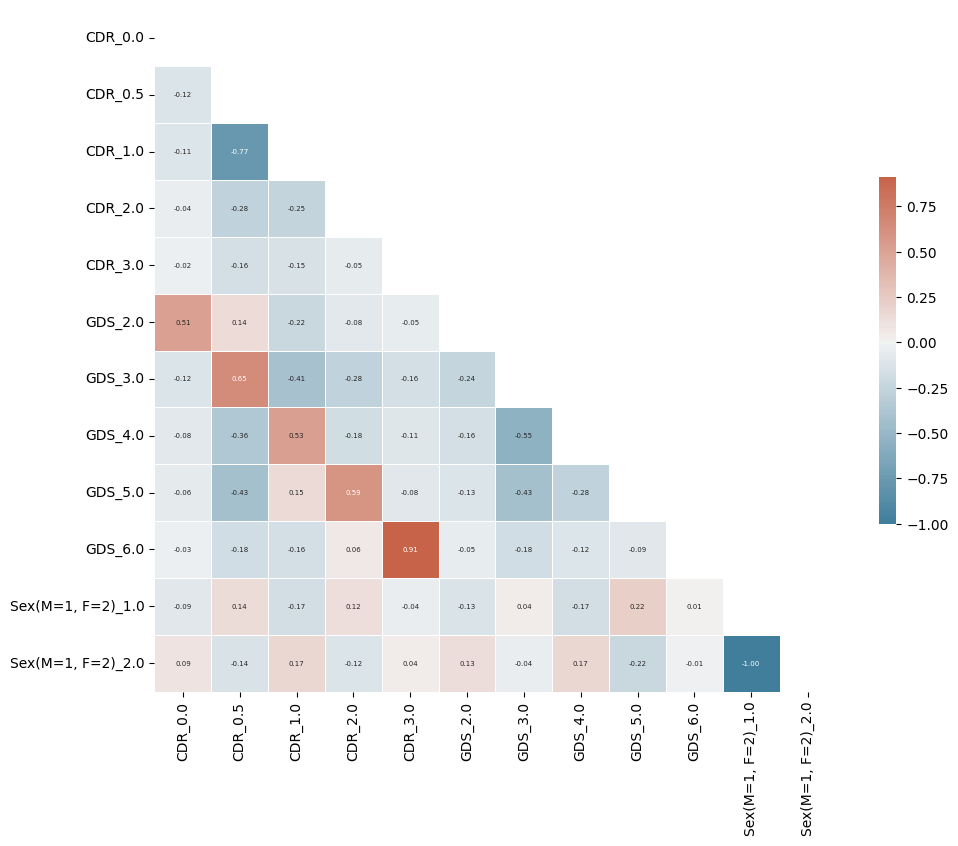

In [9]:
temp_df = df[one_hot_labels+onehot_targets].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)

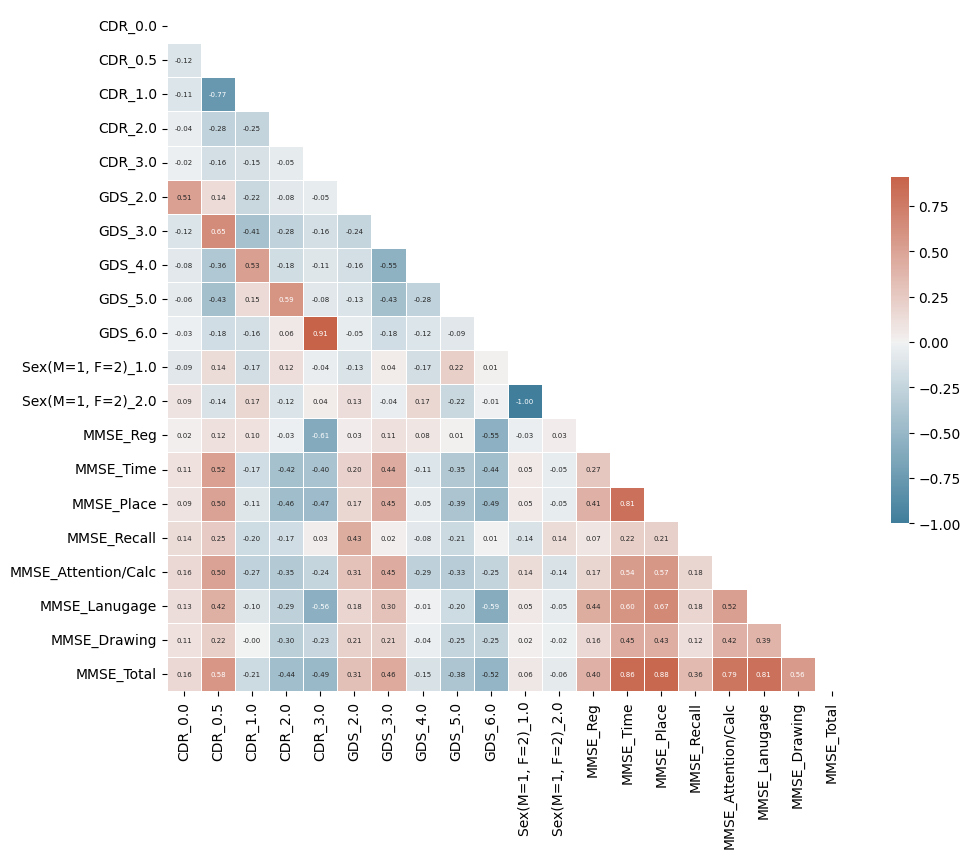

In [10]:
temp_df = df[one_hot_labels+onehot_targets+MMSE].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)

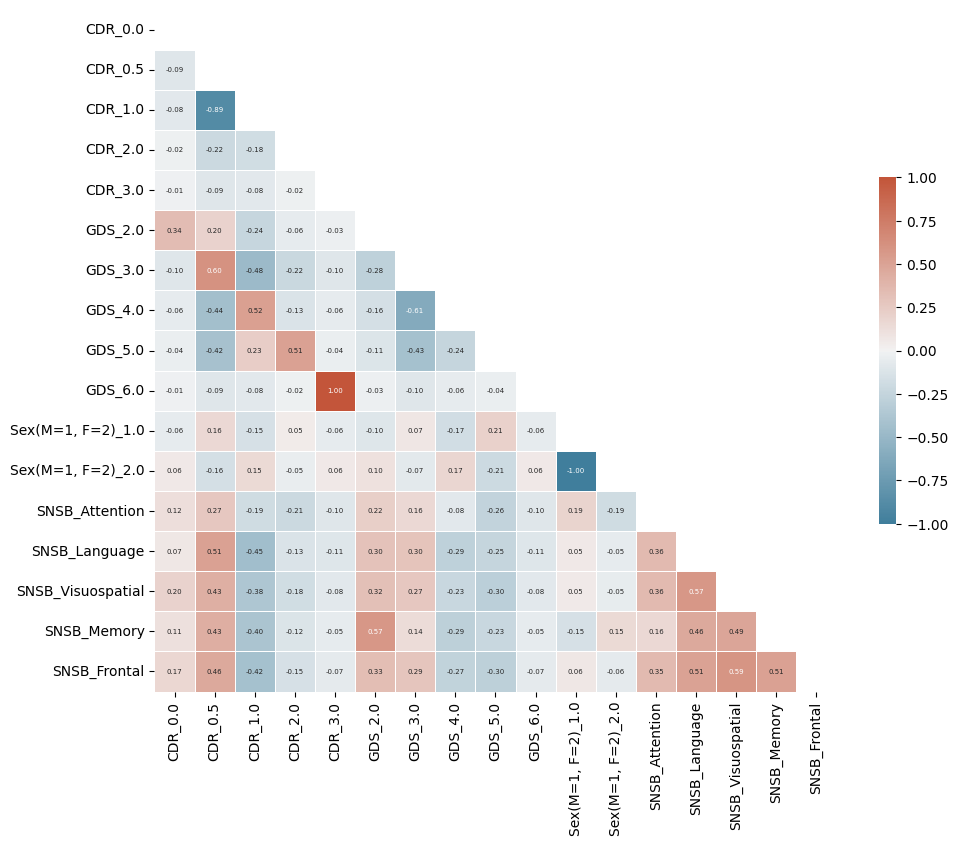

In [11]:
temp_df = df[one_hot_labels+onehot_targets+SNSB].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)

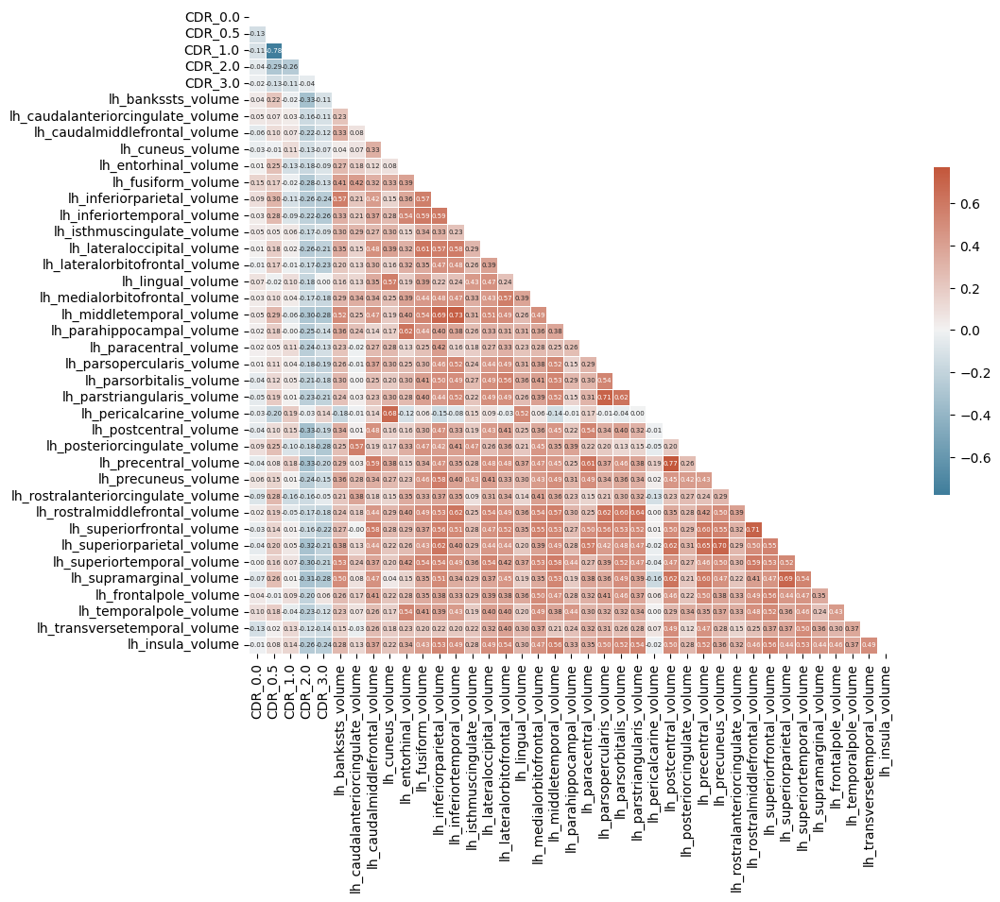

In [13]:
temp_df = df[one_hot_labels[:5]+onehot_targets+lh_DK_vol].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk

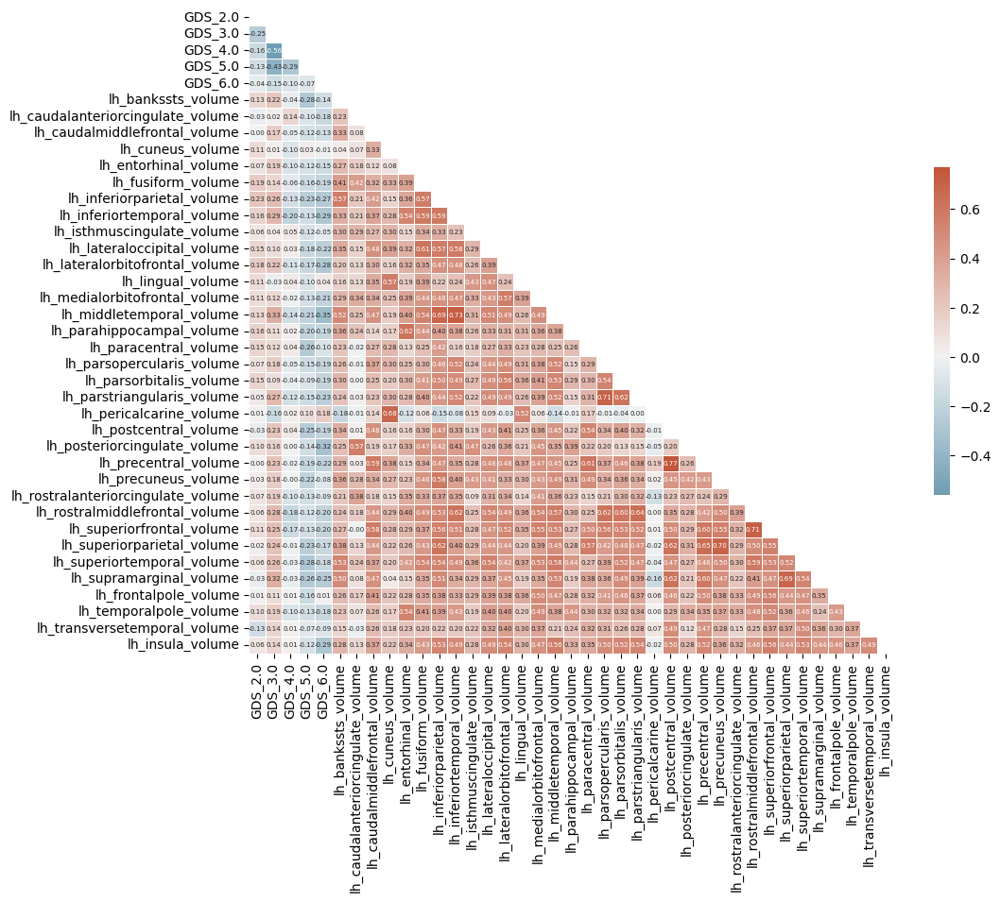

In [14]:
temp_df = df[one_hot_labels[5:10]+onehot_targets+lh_DK_vol].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk

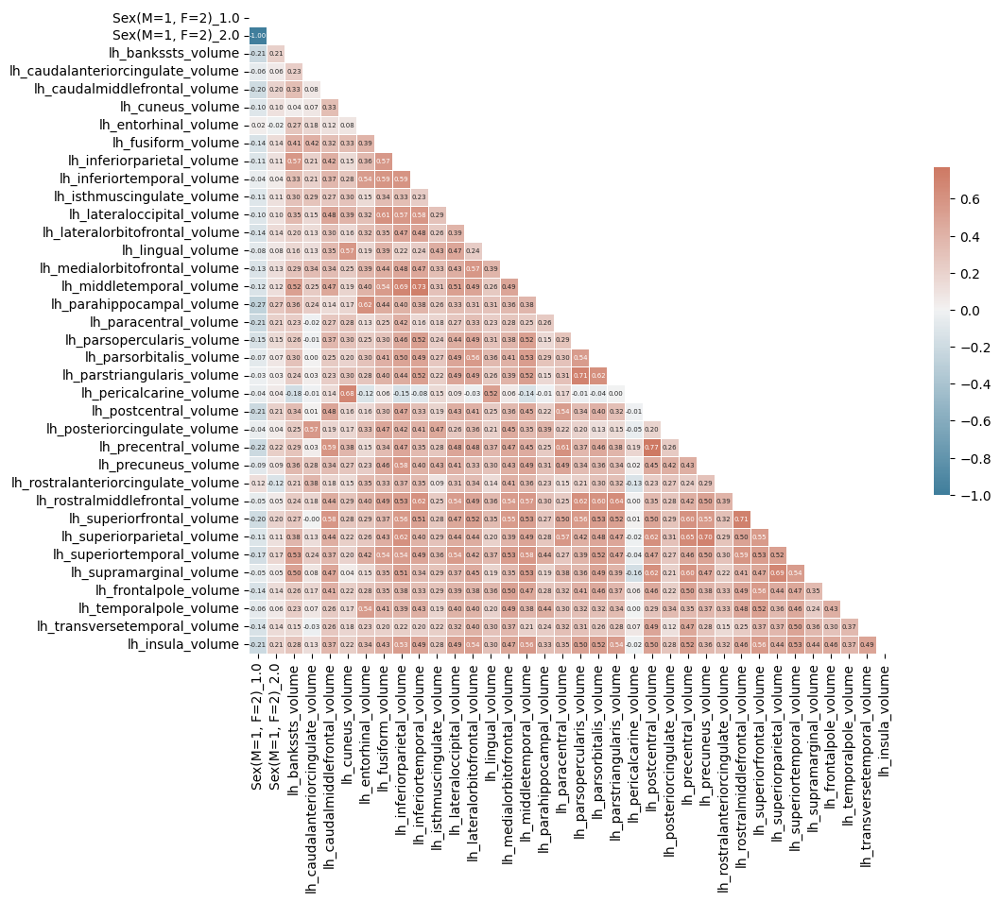

In [15]:
temp_df = df[one_hot_labels[10:12]+onehot_targets+lh_DK_vol].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk

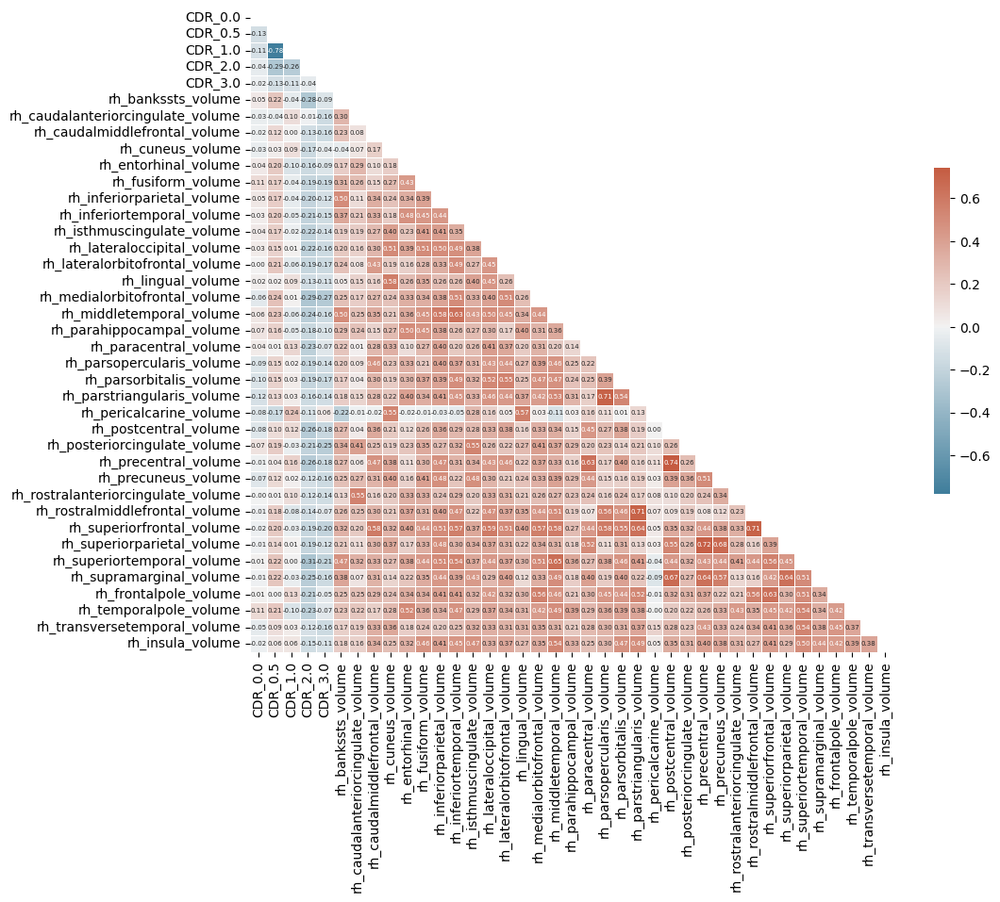

In [16]:
temp_df = df[one_hot_labels[:5]+onehot_targets+rh_DK_vol].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk

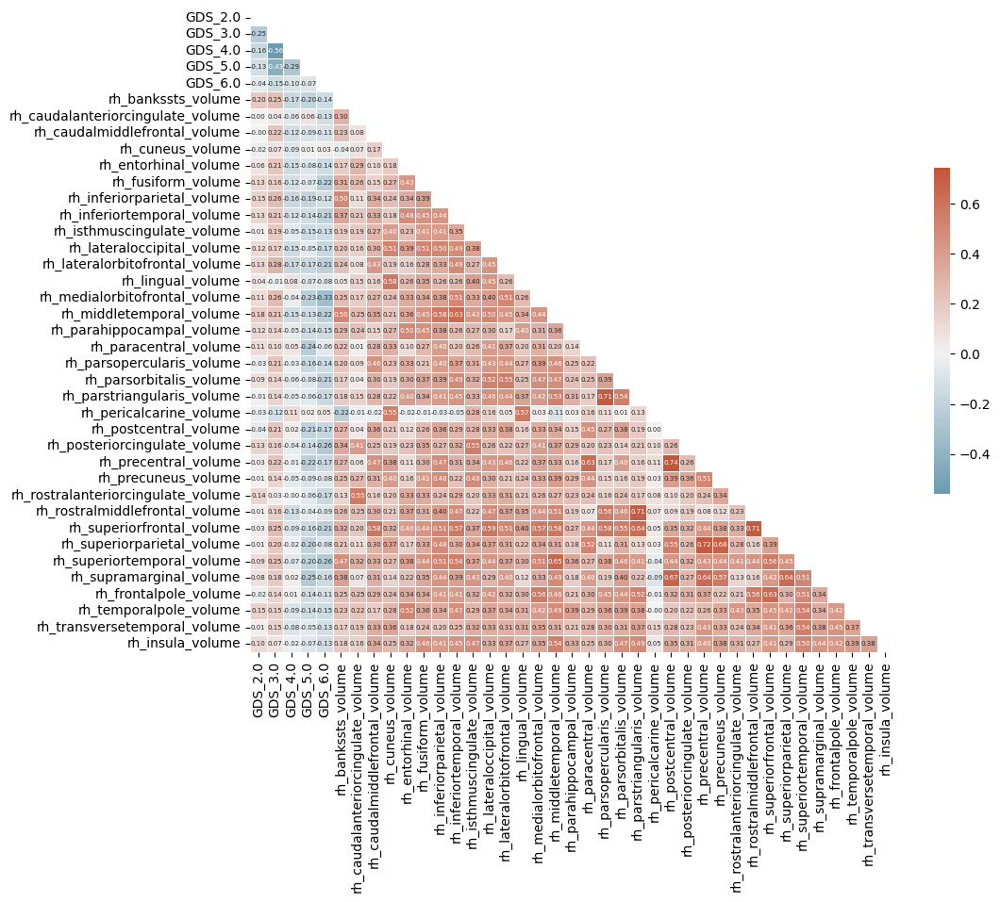

In [17]:
temp_df = df[one_hot_labels[5:10]+onehot_targets+rh_DK_vol].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk

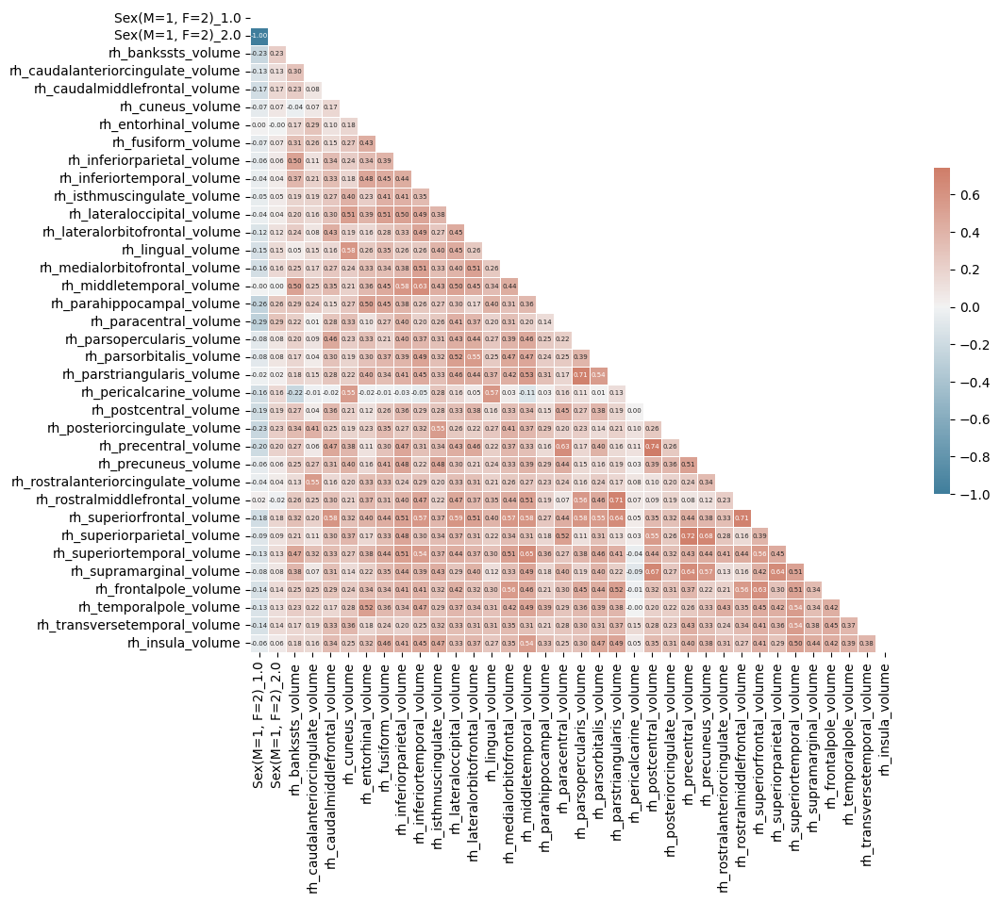

In [18]:
temp_df = df[one_hot_labels[10:]+onehot_targets+rh_DK_vol].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk

62

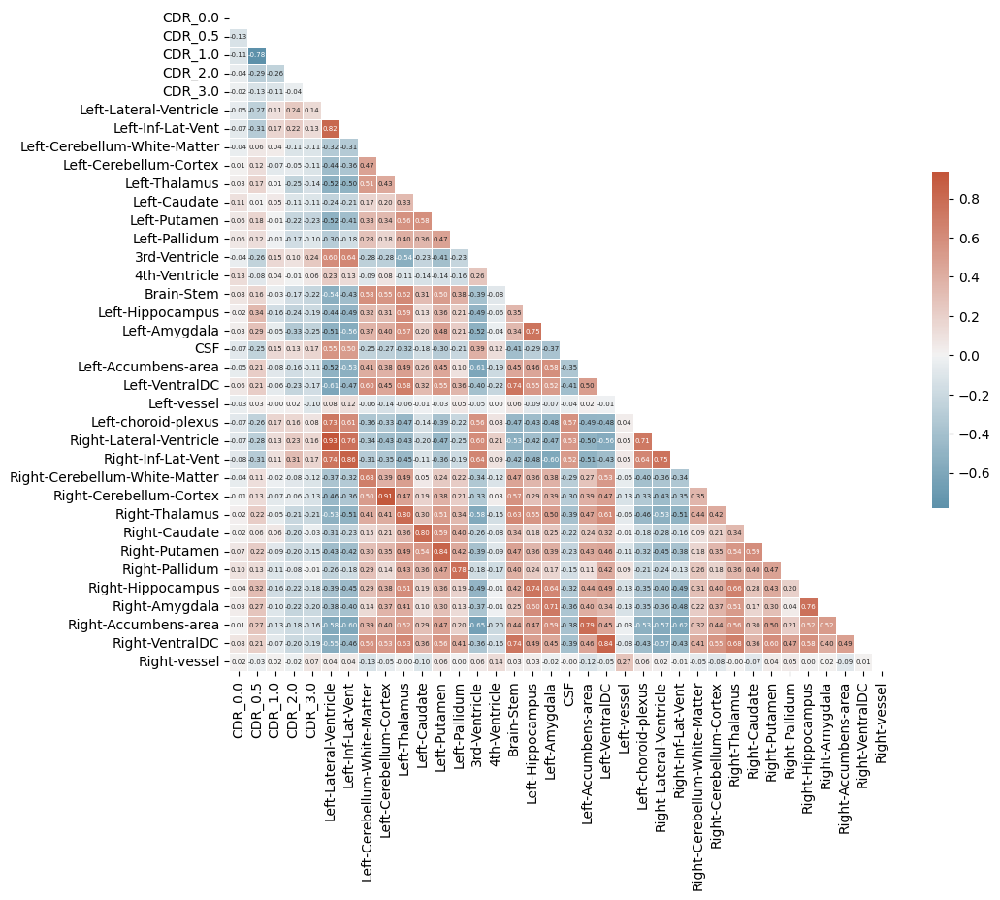

In [21]:
temp_df = df[one_hot_labels[:5]+onehot_targets+aseg[:31]].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(aseg)

62

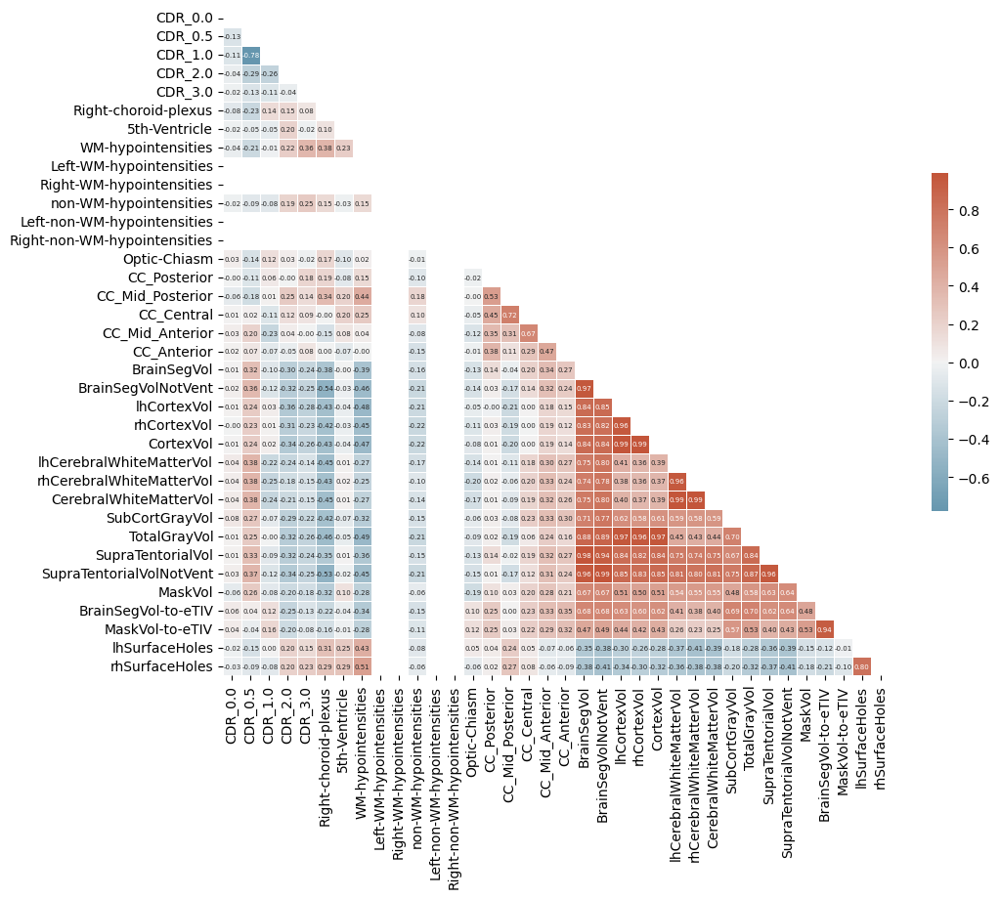

In [22]:
temp_df = df[one_hot_labels[:5]+onehot_targets+aseg[31:]].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(aseg)

62

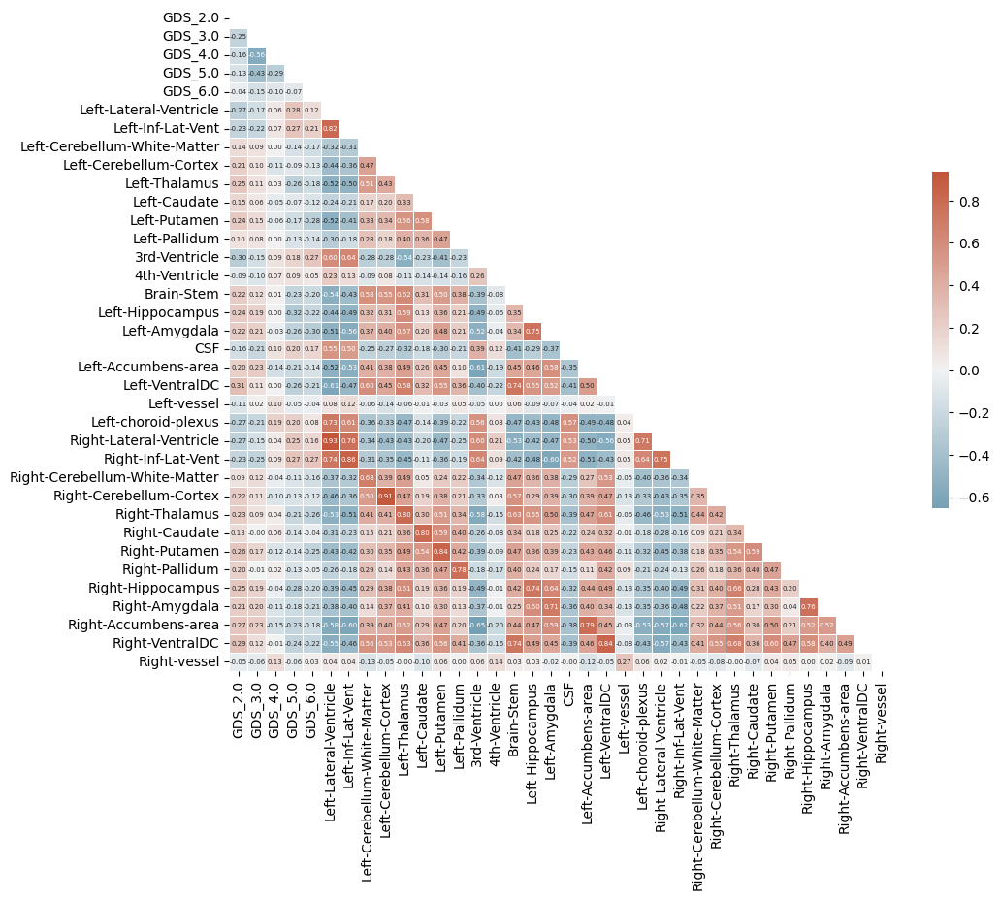

In [23]:
temp_df = df[one_hot_labels[5:10]+onehot_targets+aseg[:31]].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(aseg)

62

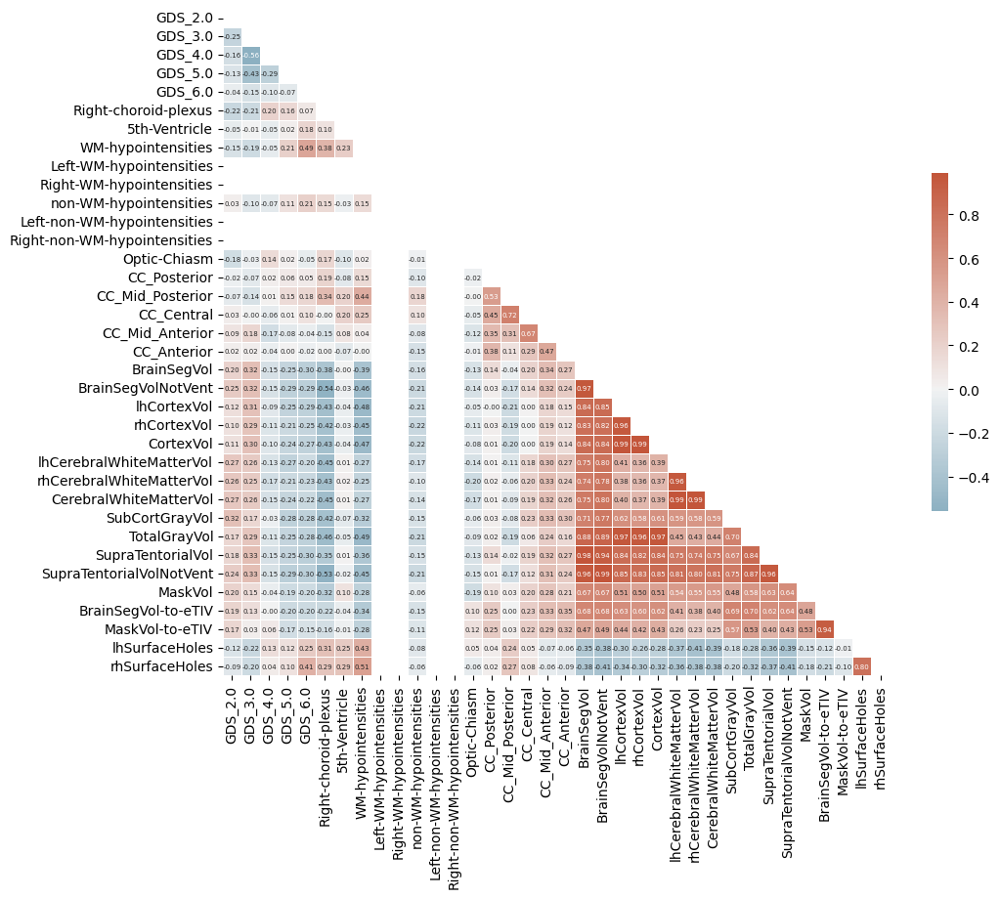

In [24]:
temp_df = df[one_hot_labels[5:10]+onehot_targets+aseg[31:]].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(aseg)

62

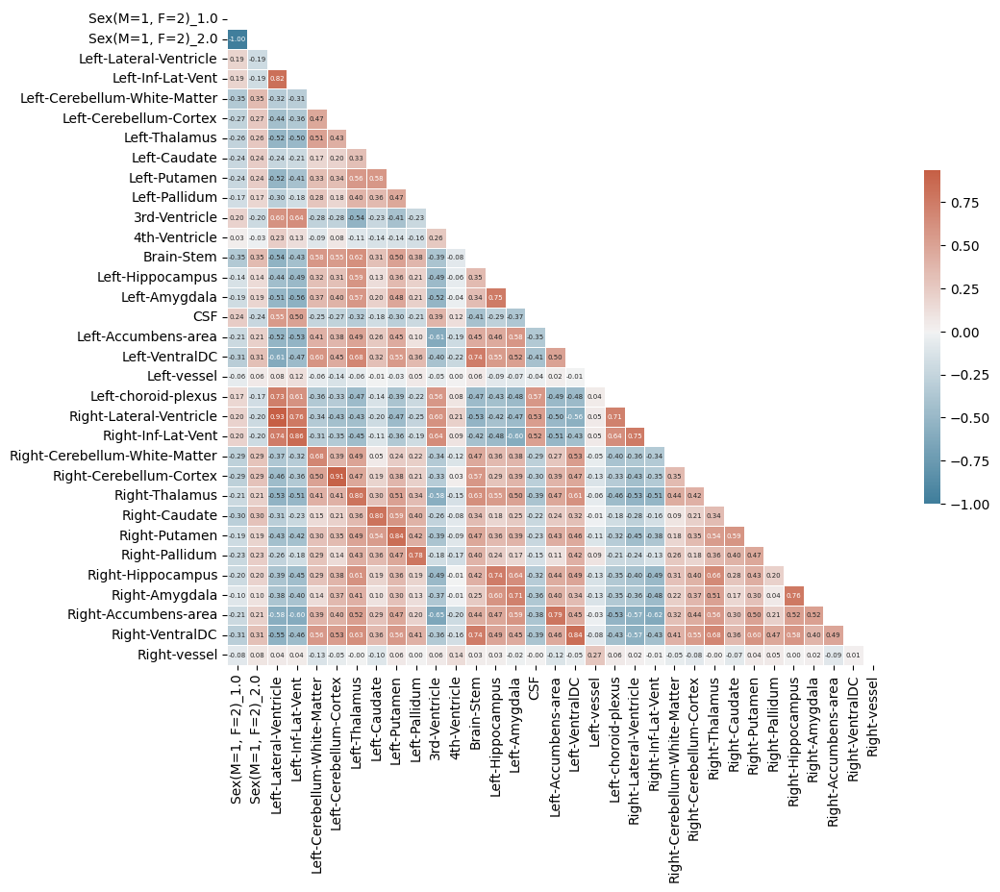

In [25]:
temp_df = df[one_hot_labels[10:]+onehot_targets+aseg[:31]].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(aseg)

62

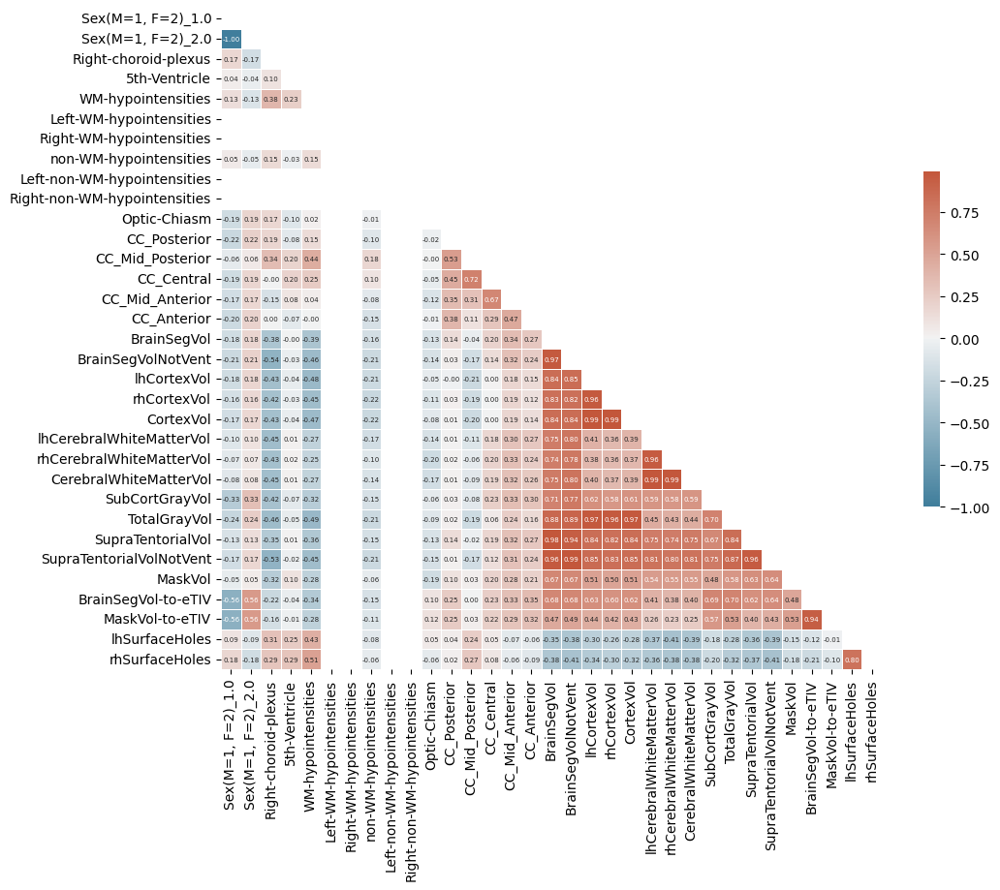

In [26]:
temp_df = df[one_hot_labels[10:]+onehot_targets+aseg[31:]].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(aseg)

35

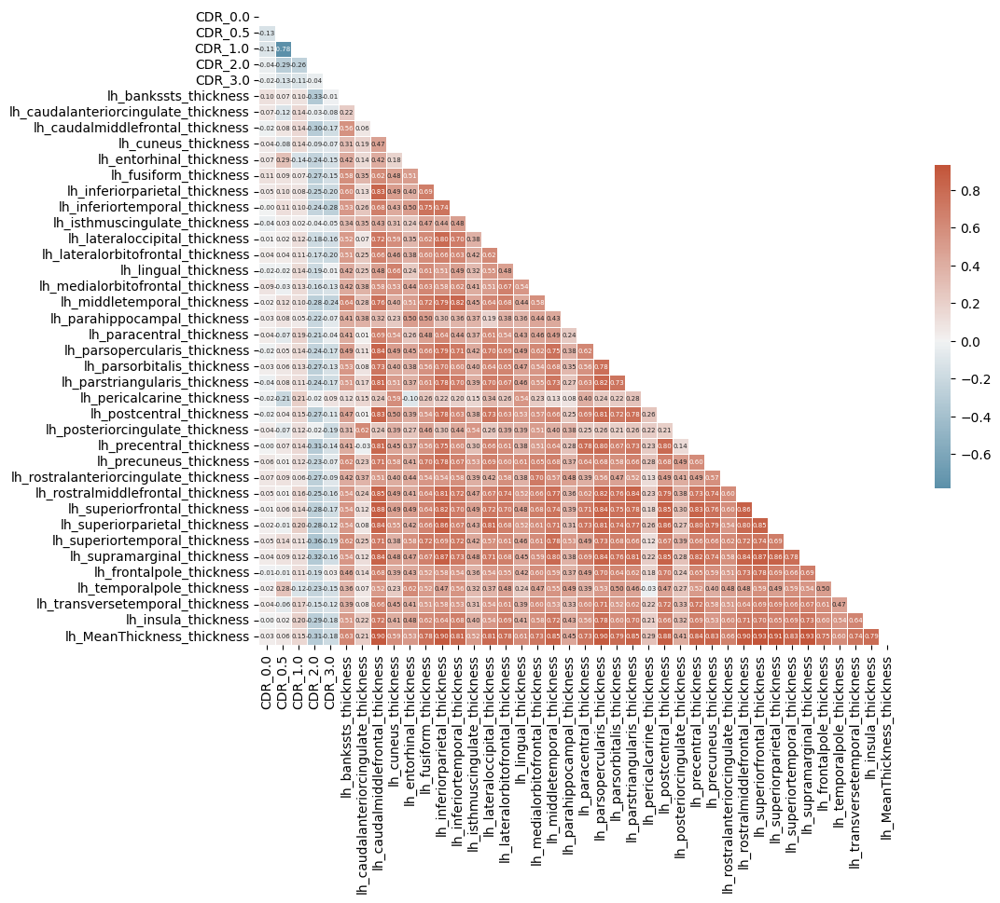

In [29]:
temp_df = df[one_hot_labels[:5]+onehot_targets+lh_DK_thk].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

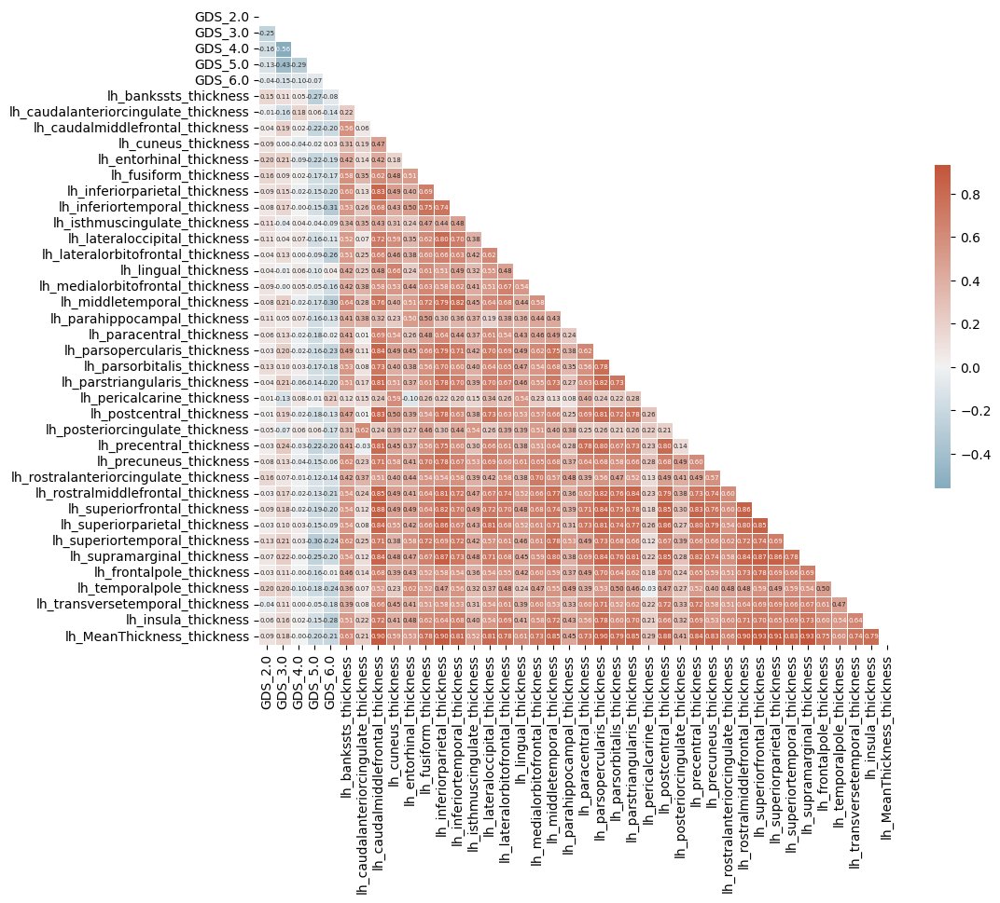

In [30]:
temp_df = df[one_hot_labels[5:10]+onehot_targets+lh_DK_thk].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

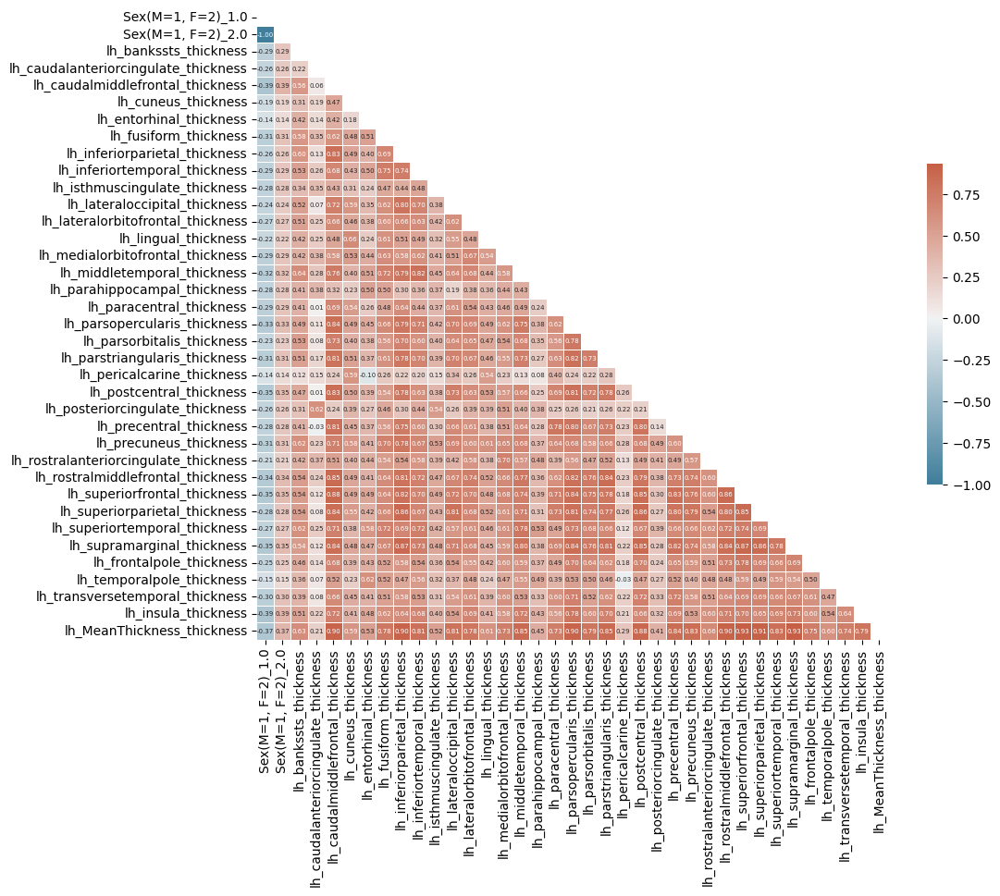

In [31]:
temp_df = df[one_hot_labels[10:]+onehot_targets+lh_DK_thk].dropna()
temp_df = temp_df.drop(onehot_targets, axis=1)
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

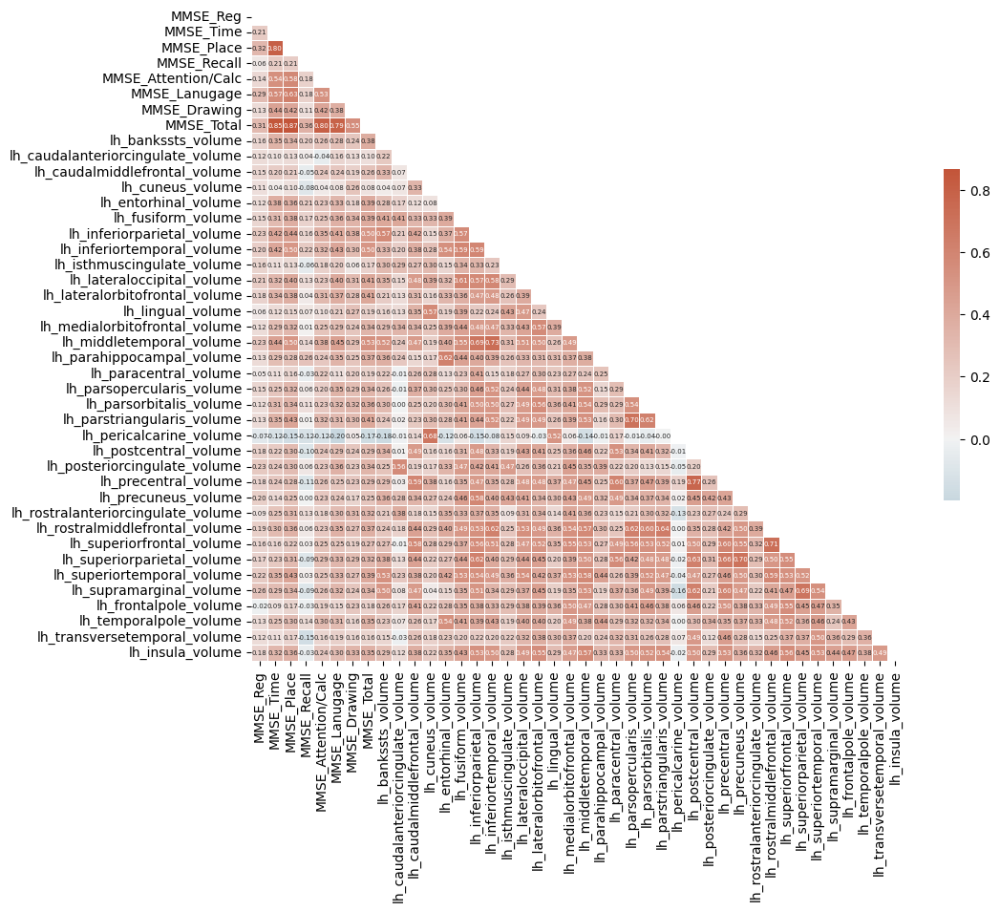

In [32]:
temp_df = df[MMSE+lh_DK_vol].dropna()
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

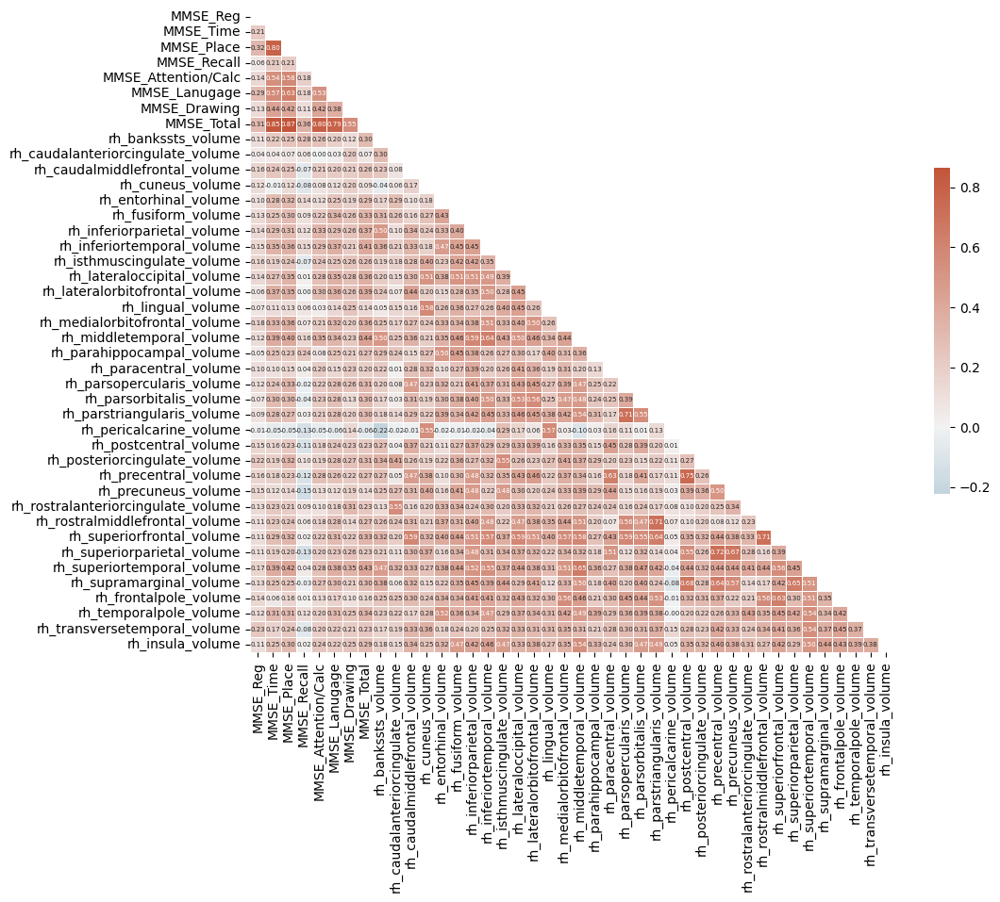

In [33]:
temp_df = df[MMSE+rh_DK_vol].dropna()
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

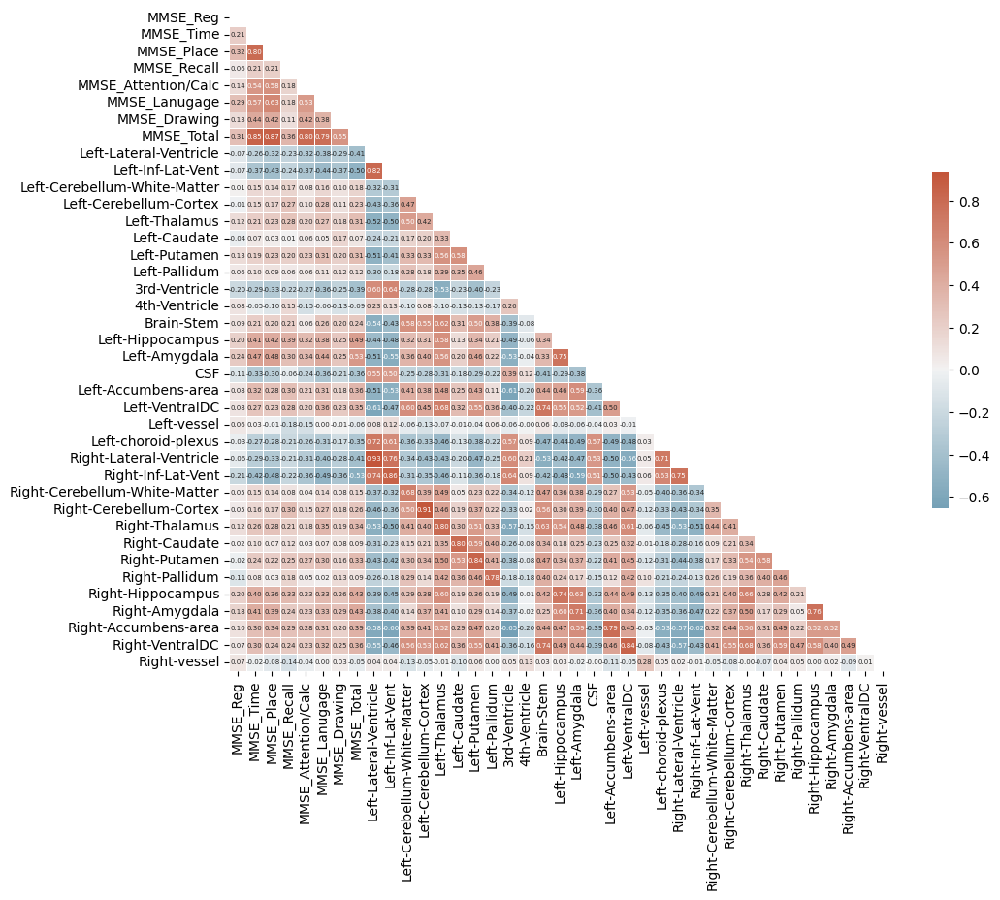

In [34]:
temp_df = df[MMSE+aseg[:31]].dropna()
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

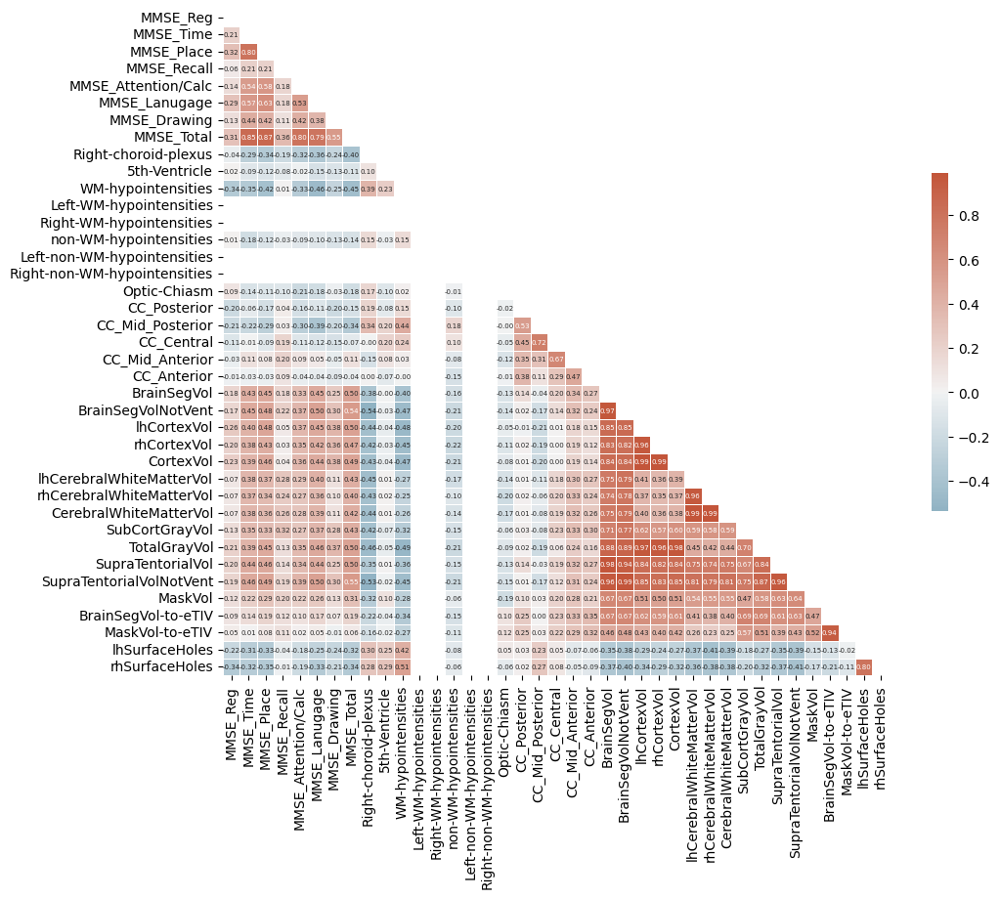

In [35]:
temp_df = df[MMSE+aseg[31:]].dropna()
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

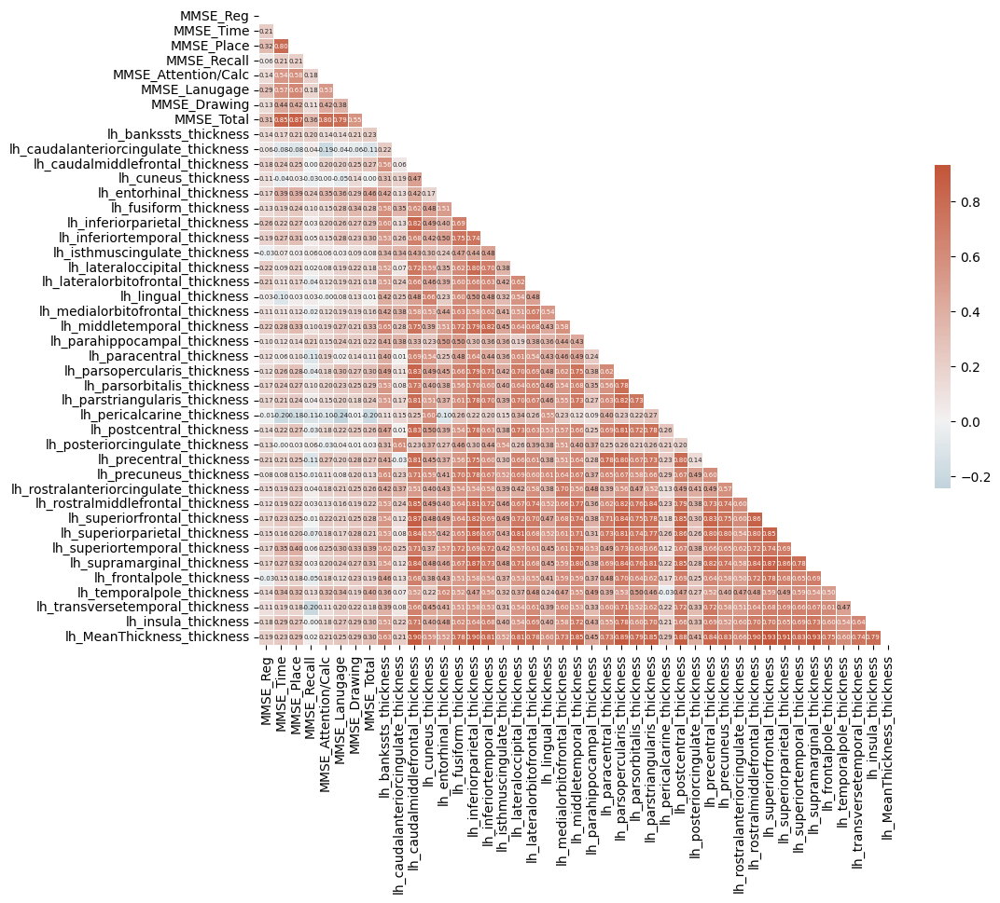

In [36]:
temp_df = df[MMSE+lh_DK_thk].dropna()
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

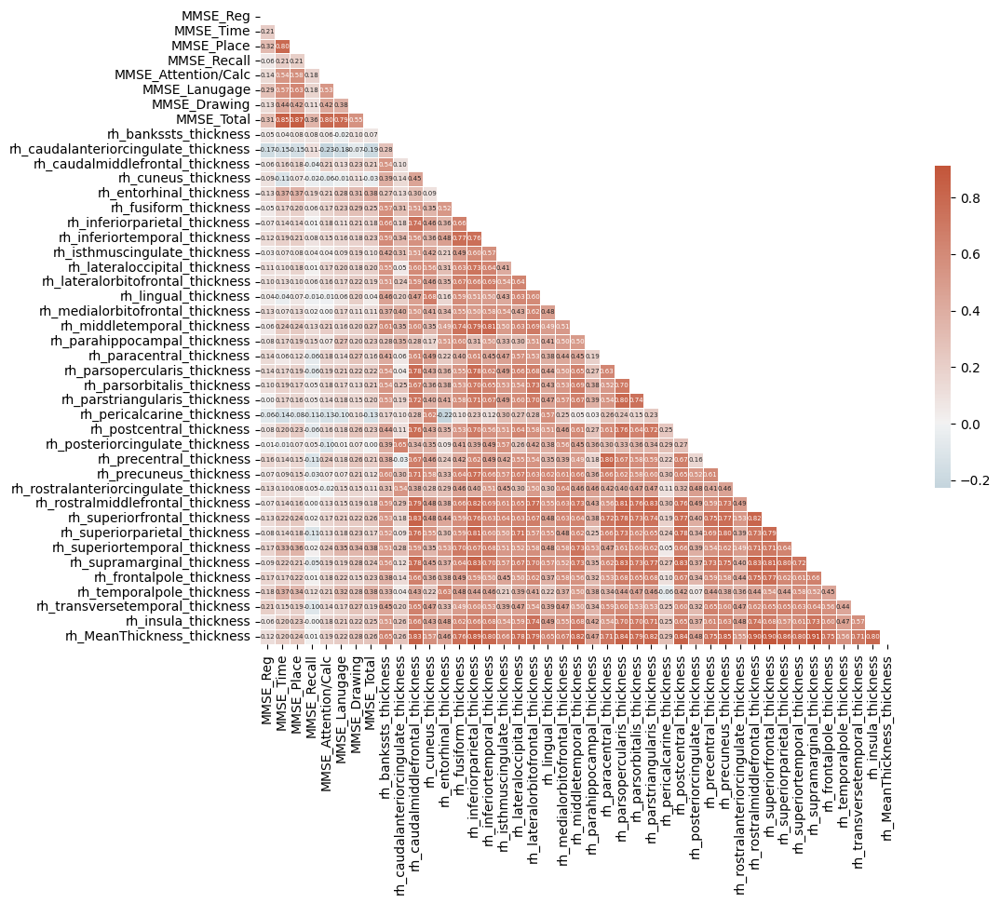

In [37]:
temp_df = df[MMSE+rh_DK_thk].dropna()
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

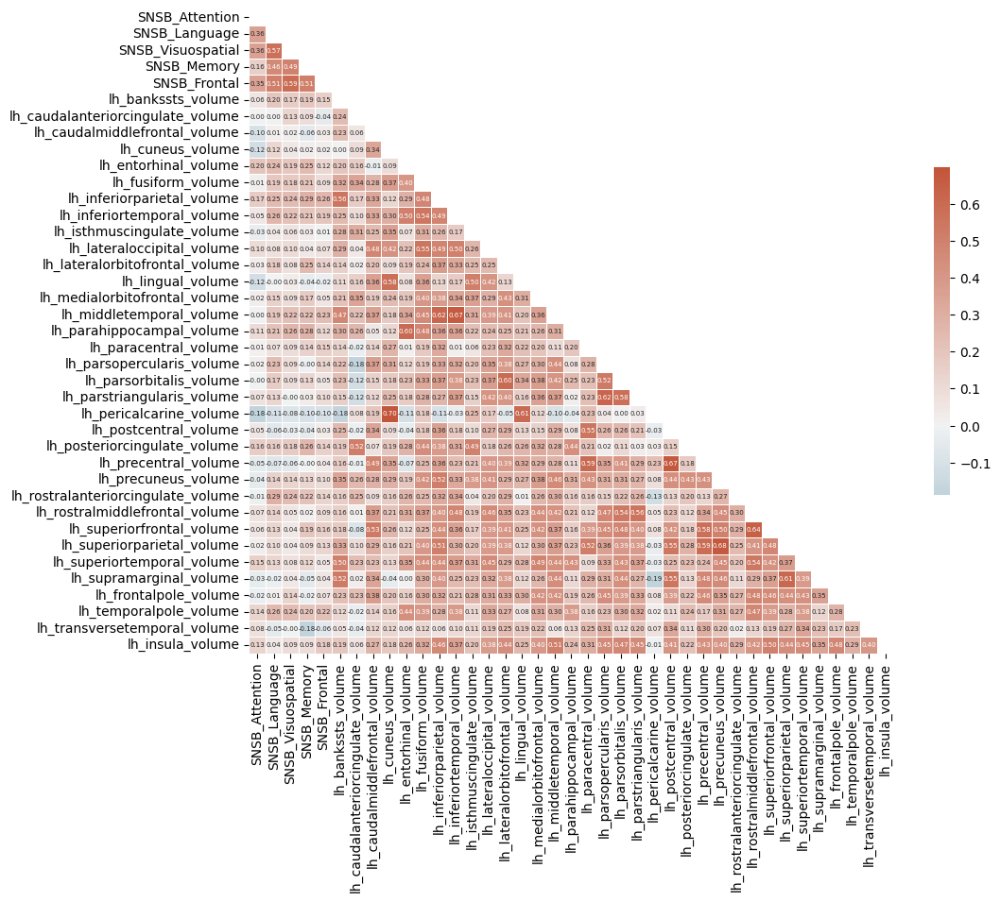

In [38]:
temp_df = df[SNSB+lh_DK_vol].dropna()
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

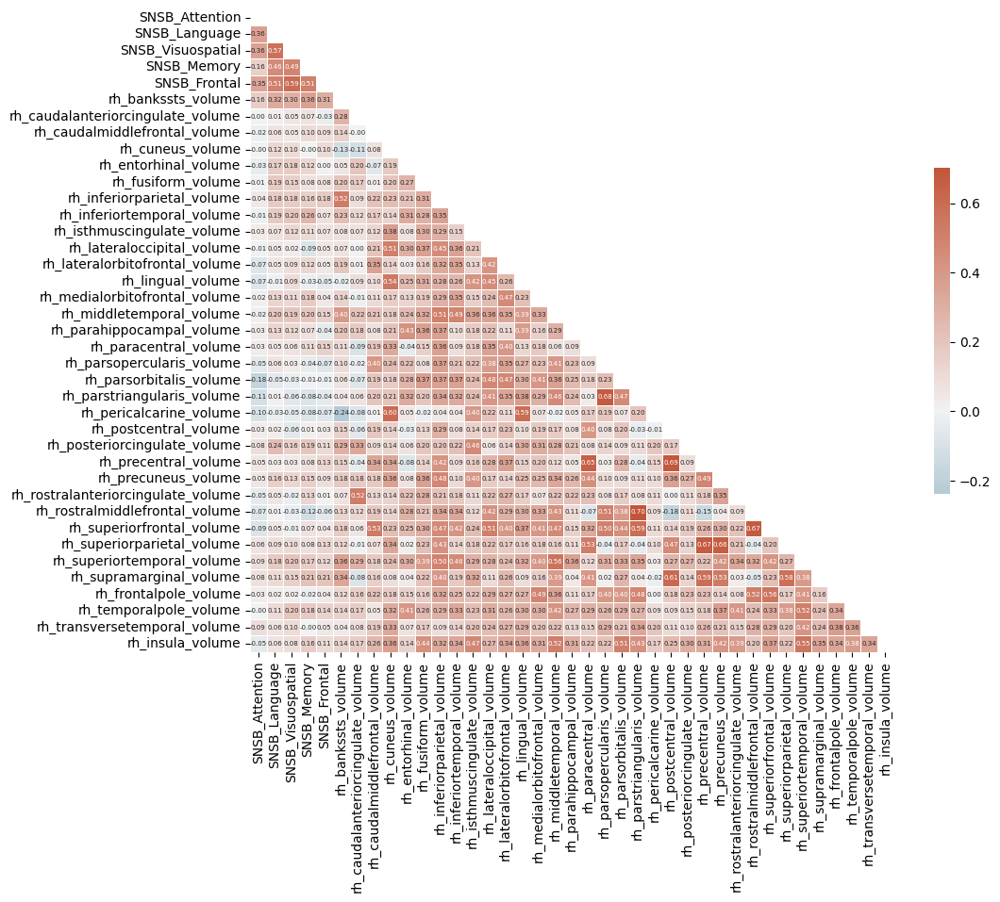

In [39]:
temp_df = df[SNSB+rh_DK_vol].dropna()
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

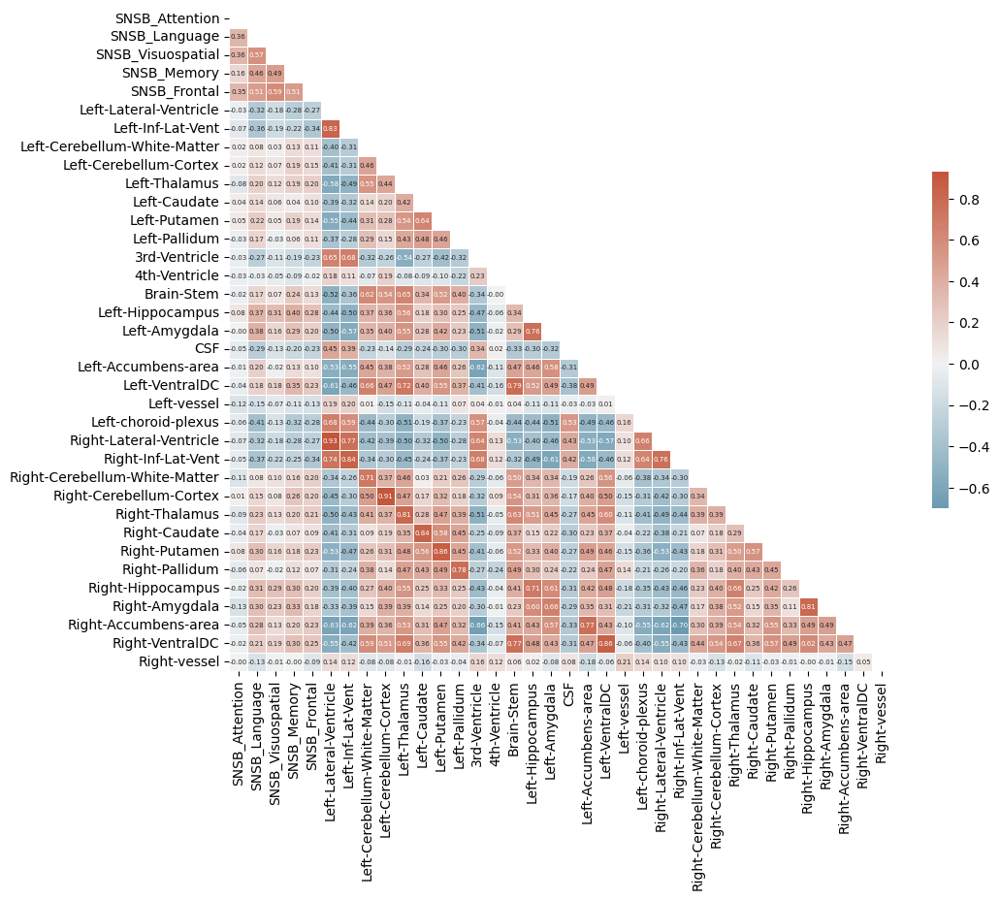

In [40]:
temp_df = df[SNSB+aseg[:31]].dropna()
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

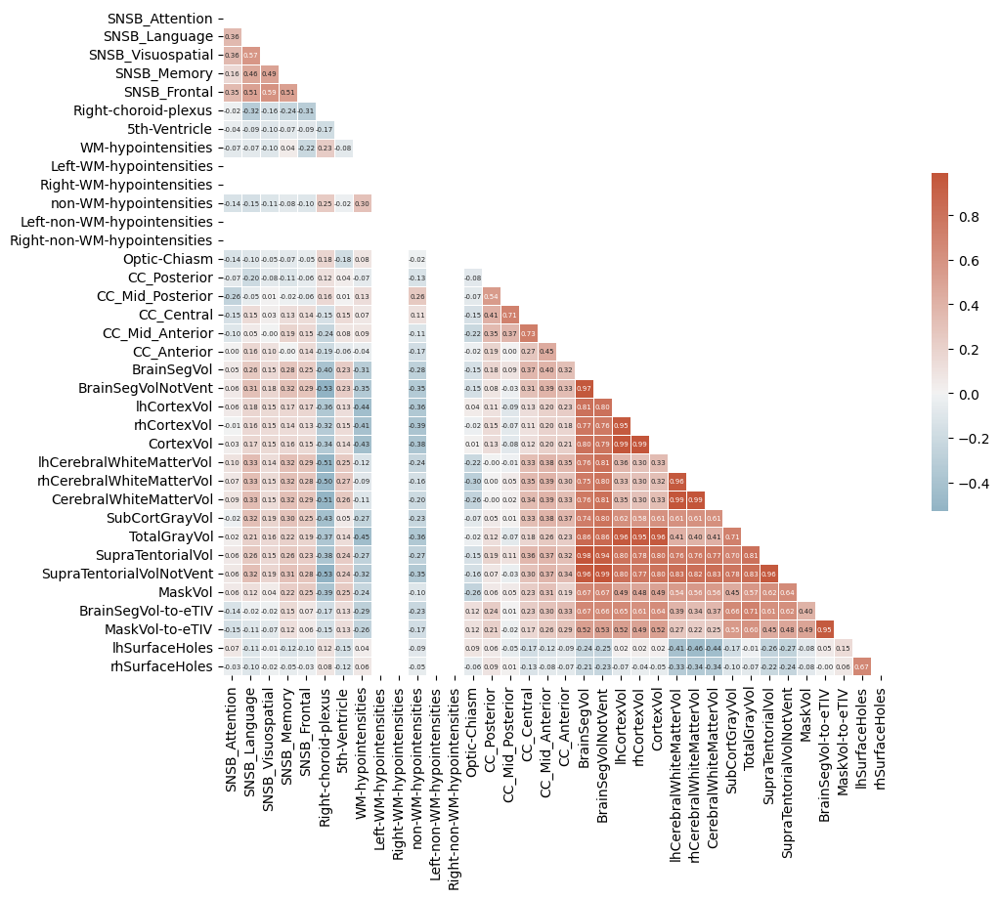

In [41]:
temp_df = df[SNSB+aseg[31:]].dropna()
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

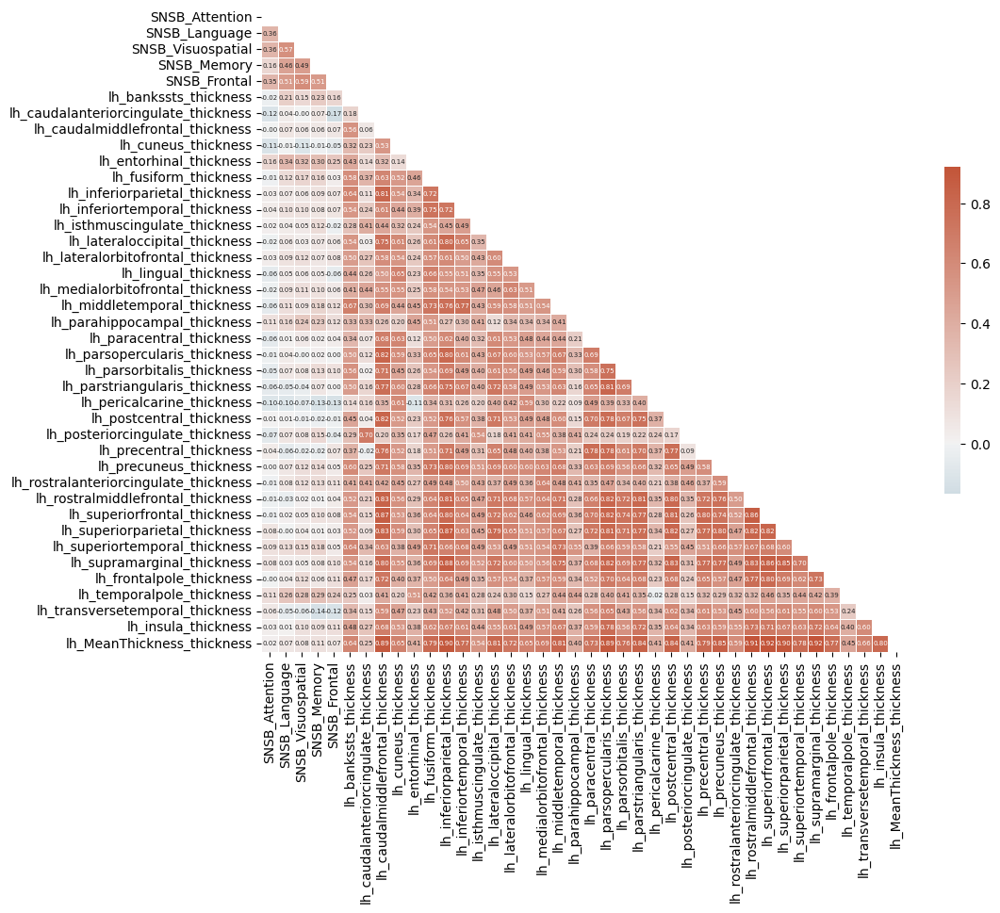

In [42]:
temp_df = df[SNSB+lh_DK_thk].dropna()
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

35

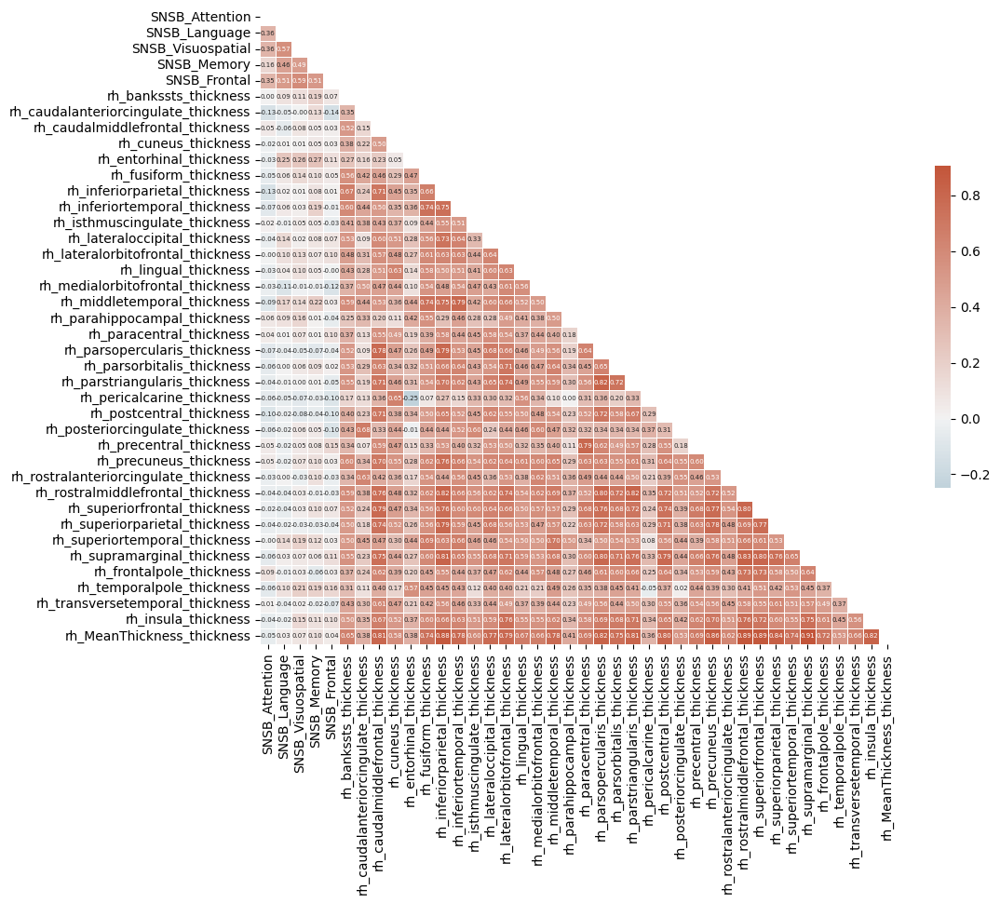

In [43]:
temp_df = df[SNSB+rh_DK_thk].dropna()
corr = temp_df.corr()
# df = df.drop(onehot_targets, axis=1)
draw_corr(corr=corr)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk
len(lh_DK_thk)

In [62]:
['DID', 'Age', 'Sex(M=1, F=2)', 'Education', 'Diagnosis',
       'Diagnosis_Sub', 'CDR', 'GDS', 'MMSE_Reg', 'MMSE_Time', 'MMSE_Place',
       'MMSE_Recall', 'MMSE_Attention/Calc', 'MMSE_Lanugage', 'MMSE_Drawing',
       'MMSE_Total', 'Hypertension', 'Diabete', 'Hyperlipidemia', 'Alchol',
       'Smoking', 'SNSB_Attention', 'SNSB_Language', 'SNSB_Visuospatial',
       'SNSB_Memory', 'SNSB_Frontal']

# 103개 가지고 함
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from umap import UMAP
# 나이에 따른 주성분 분석
# 교육에 따른 주성분 분석
# CDR에 따른 주성분 분석
# GDS에 따른 주성분 분석
# MMSE_total score에 따른 주성분분석 --> drop MMSE_z

def do_PCA(name, source_list, title=None):

       pca = PCA(n_components=2)
       
       scaler = StandardScaler()
       raw_df[source_list] = scaler.fit_transform(raw_df[source_list])

       low_dim = pca.fit_transform(raw_df[source_list])

       pca1 = low_dim[..., 0]
       pca2 = low_dim[..., 1]
       pivot = raw_df.dropna()[name].values
       
       dict = {name:pivot, 'PCA 1':pca1, 'PCA 2':pca2}
       PCA_results = pd.DataFrame(dict)
       # print(PCA_results.shape)
       sns.scatterplot(PCA_results, x='PCA 1',y='PCA 2', hue=name, palette='Spectral')
       # sns.color_palette('Spectral', as_cmap=True )
       if not title==None:
              plt.title(f'{title} PCA projection with {name}')
       else:
              plt.title(name)
       
def do_UMAP(name, source_list, title=None):

       umap = UMAP(random_state=411)
       scaler = StandardScaler()
       raw_df[source_list] = scaler.fit_transform(raw_df[source_list])
       low_dim = umap.fit_transform(raw_df[source_list])
       
       
       umap1 = low_dim[..., 0]
       umap2 = low_dim[..., 1]
       pivot = raw_df.dropna()[name].values

       dict = {name:pivot, 'UMAP 1':umap1, 'UMAP 2':umap2}
       UMAP_results = pd.DataFrame(dict)
       # print(UMAP_results.shape)
       sns.scatterplot(UMAP_results, x='UMAP 1',y='UMAP 2', hue=name, palette='Spectral')
       if not title==None:
              plt.title(f'{title} UMAP projection with {name}')
       else:
              plt.title(name)
       



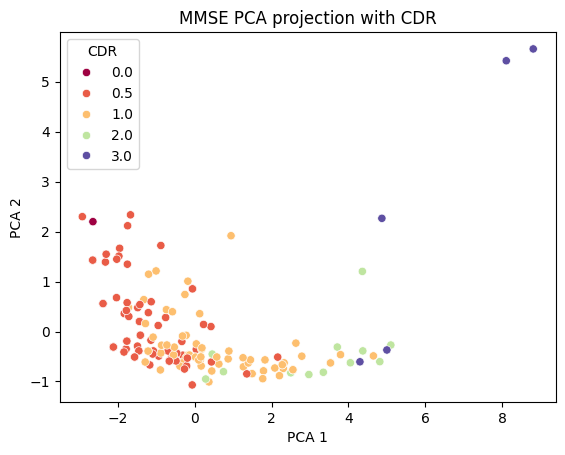

In [63]:
target = MMSE+['CDR']
raw_df = df[target].dropna()

do_PCA(
    name='CDR',
    source_list=MMSE,
    title='MMSE'
)

c:\Users\user\miniconda3\envs\medical\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


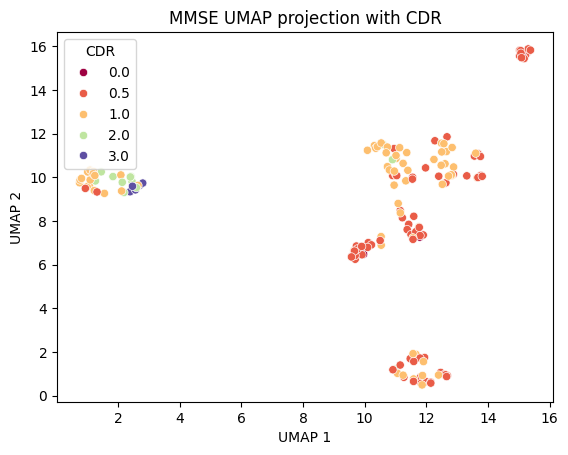

In [65]:
target = MMSE+['CDR']
raw_df = df[target].dropna()

do_UMAP(
    name='CDR',
    source_list=MMSE,
    title='MMSE'
)

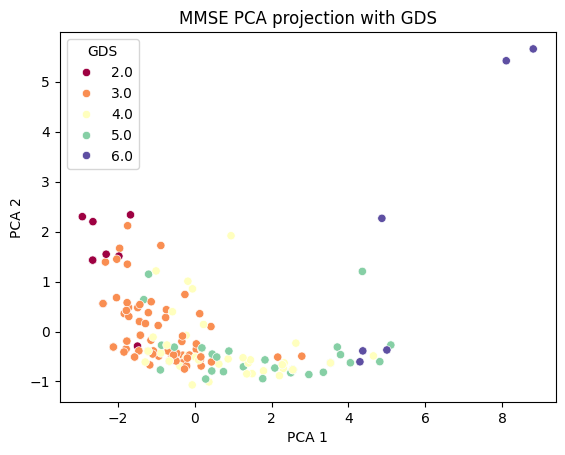

In [66]:
target = MMSE+['GDS']
raw_df = df[target].dropna()

do_PCA(
    name='GDS',
    source_list=MMSE,
    title='MMSE'
)

c:\Users\user\miniconda3\envs\medical\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


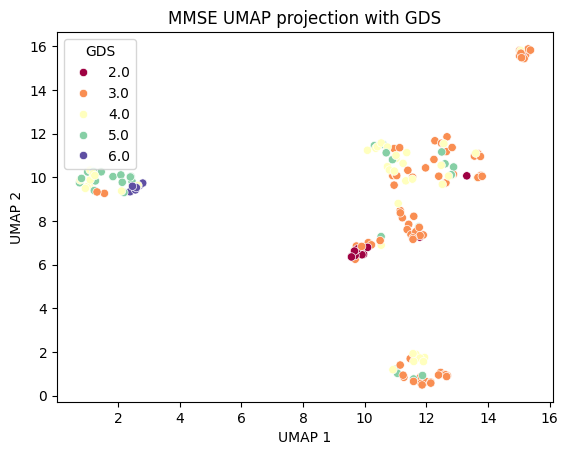

In [67]:
target = MMSE+['GDS']
raw_df = df[target].dropna()

do_UMAP(
    name='GDS',
    source_list=MMSE,
    title='MMSE'
)

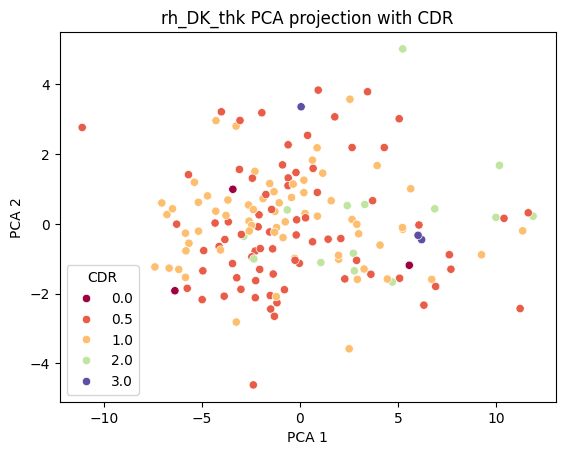

In [73]:
target = rh_DK_thk+['GDS']
raw_df = df[target].dropna()

do_PCA(
    name='GDS',
    source_list=rh_DK_thk,
    title='rh_DK_thk'
)
# lh_DK_vol
# rh_DK_vol
# aseg
# lh_DK_thk
# rh_DK_thk

c:\Users\user\miniconda3\envs\medical\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


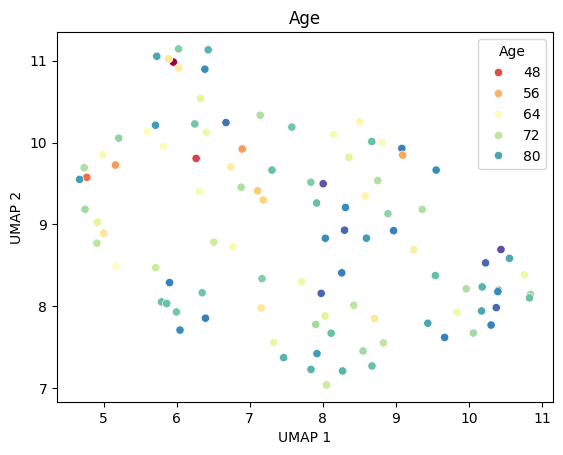

In [ ]:
do_UMAP(
    name='Age',
    source_list=
['Education', 'CDR', 'GDS', 'MMSE_Reg', 'MMSE_Time', 'MMSE_Place',
              'MMSE_Recall', 'MMSE_Attention/Calc', 'MMSE_Lanugage', 'MMSE_Drawing',
              'MMSE_Total', 'Hypertension', 'Diabete', 'Hyperlipidemia', 'Alchol',
              'Smoking', 'SNSB_Attention', 'SNSB_Language', 'SNSB_Visuospatial',
              'SNSB_Memory', 'SNSB_Frontal']
)

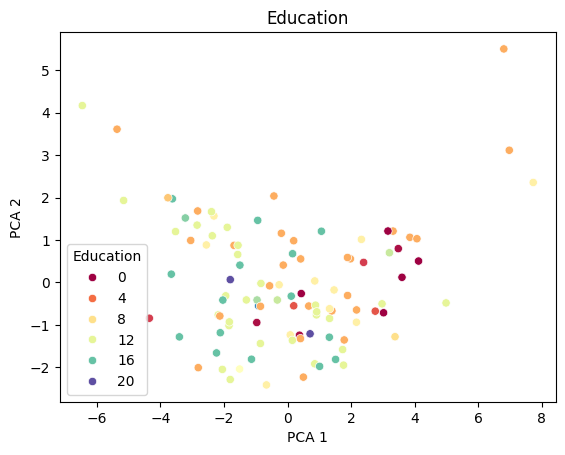

In [ ]:
do_PCA(
    name='Education',
    source_list=
['Age', 'CDR', 'GDS', 'MMSE_Reg', 'MMSE_Time', 'MMSE_Place',
              'MMSE_Recall', 'MMSE_Attention/Calc', 'MMSE_Lanugage', 'MMSE_Drawing',
              'MMSE_Total', 'Hypertension', 'Diabete', 'Hyperlipidemia', 'Alchol',
              'Smoking', 'SNSB_Attention', 'SNSB_Language', 'SNSB_Visuospatial',
              'SNSB_Memory', 'SNSB_Frontal']
)

c:\Users\user\miniconda3\envs\medical\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


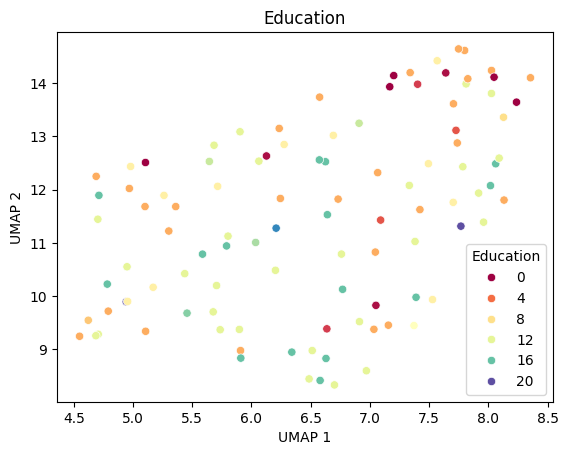

In [ ]:
do_UMAP(
    name='Education',
    source_list=
['Age', 'CDR', 'GDS', 'MMSE_Reg', 'MMSE_Time', 'MMSE_Place',
              'MMSE_Recall', 'MMSE_Attention/Calc', 'MMSE_Lanugage', 'MMSE_Drawing',
              'MMSE_Total', 'Hypertension', 'Diabete', 'Hyperlipidemia', 'Alchol',
              'Smoking', 'SNSB_Attention', 'SNSB_Language', 'SNSB_Visuospatial',
              'SNSB_Memory', 'SNSB_Frontal']
)

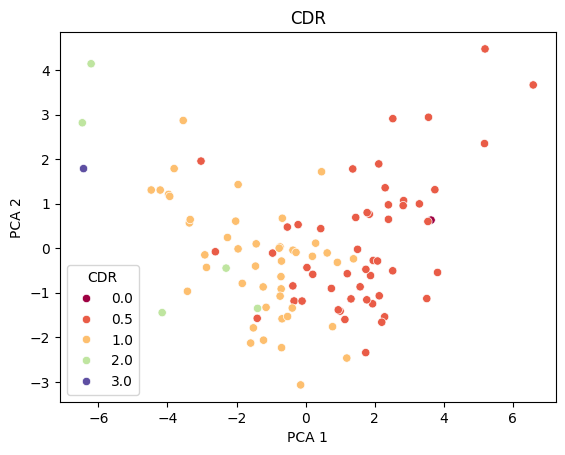

In [ ]:
do_PCA(
    name='CDR',
    source_list=
['Age', 'Education', 'GDS', 'MMSE_Reg', 'MMSE_Time', 'MMSE_Place',
              'MMSE_Recall', 'MMSE_Attention/Calc', 'MMSE_Lanugage', 'MMSE_Drawing',
              'MMSE_Total', 'Hypertension', 'Diabete', 'Hyperlipidemia', 'Alchol',
              'Smoking', 'SNSB_Attention', 'SNSB_Language', 'SNSB_Visuospatial',
              'SNSB_Memory', 'SNSB_Frontal']
)

c:\Users\user\miniconda3\envs\medical\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


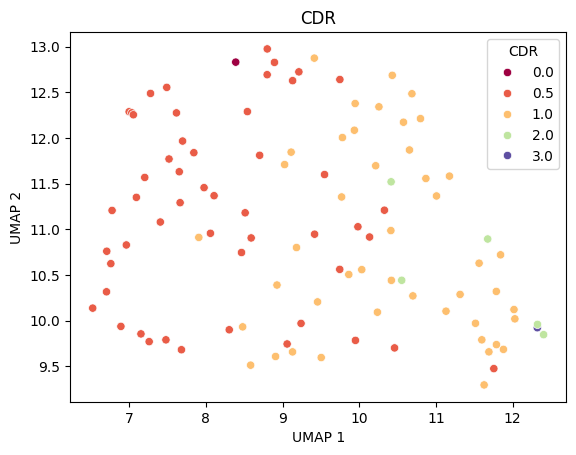

In [ ]:
do_UMAP(
    name='CDR',
    source_list=
['Age', 'Education', 'GDS', 'MMSE_Reg', 'MMSE_Time', 'MMSE_Place',
              'MMSE_Recall', 'MMSE_Attention/Calc', 'MMSE_Lanugage', 'MMSE_Drawing',
              'MMSE_Total', 'Hypertension', 'Diabete', 'Hyperlipidemia', 'Alchol',
              'Smoking', 'SNSB_Attention', 'SNSB_Language', 'SNSB_Visuospatial',
              'SNSB_Memory', 'SNSB_Frontal']
)

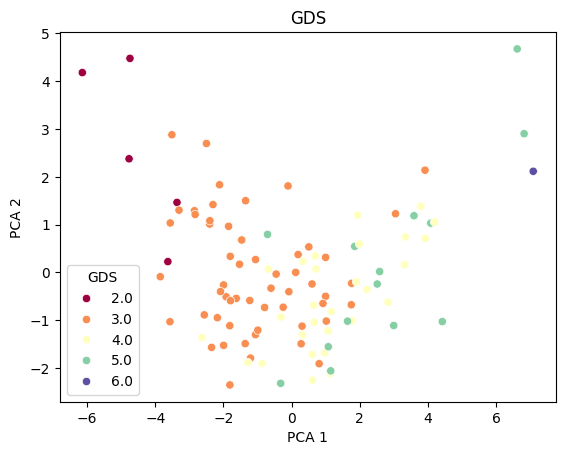

In [ ]:
do_PCA(
    name='GDS',
    source_list=
['Age', 'Education', 'CDR', 'MMSE_Reg', 'MMSE_Time', 'MMSE_Place',
              'MMSE_Recall', 'MMSE_Attention/Calc', 'MMSE_Lanugage', 'MMSE_Drawing',
              'MMSE_Total', 'Hypertension', 'Diabete', 'Hyperlipidemia', 'Alchol',
              'Smoking', 'SNSB_Attention', 'SNSB_Language', 'SNSB_Visuospatial',
              'SNSB_Memory', 'SNSB_Frontal']
)

c:\Users\user\miniconda3\envs\medical\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


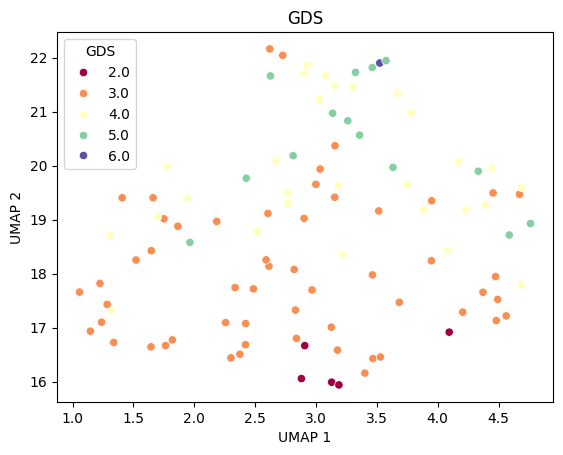

In [ ]:
do_UMAP(
    name='GDS',
    source_list=
['Age', 'Education', 'CDR', 'MMSE_Reg', 'MMSE_Time', 'MMSE_Place',
              'MMSE_Recall', 'MMSE_Attention/Calc', 'MMSE_Lanugage', 'MMSE_Drawing',
              'MMSE_Total', 'Hypertension', 'Diabete', 'Hyperlipidemia', 'Alchol',
              'Smoking', 'SNSB_Attention', 'SNSB_Language', 'SNSB_Visuospatial',
              'SNSB_Memory', 'SNSB_Frontal']
)

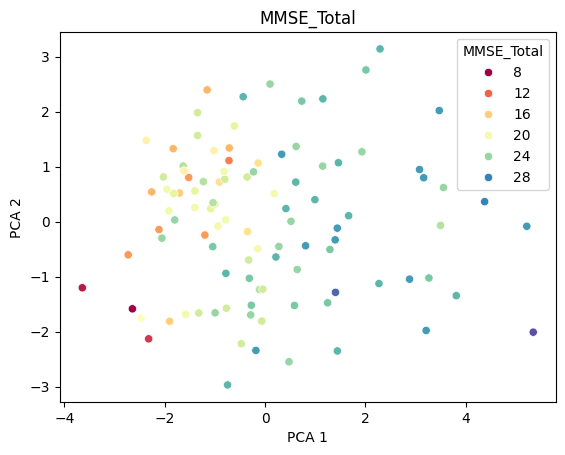

In [ ]:
do_PCA(
    name='MMSE_Total',
    source_list=
['Age', 'Education', 'CDR', 'Hypertension', 'Diabete', 'Hyperlipidemia', 'Alchol',
              'Smoking', 'SNSB_Attention', 'SNSB_Language', 'SNSB_Visuospatial',
              'SNSB_Memory', 'SNSB_Frontal']
)

c:\Users\user\miniconda3\envs\medical\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


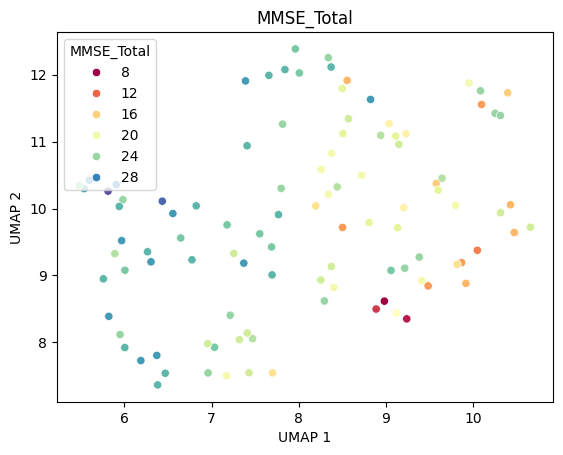

In [ ]:
do_UMAP(
    name='MMSE_Total',
    source_list=
['Age', 'Education', 'CDR', 'Hypertension', 'Diabete', 'Hyperlipidemia', 'Alchol',
              'Smoking', 'SNSB_Attention', 'SNSB_Language', 'SNSB_Visuospatial',
              'SNSB_Memory', 'SNSB_Frontal']
)